In [1]:
# %pip  install opencv-python
# %pip  install pandas
# %pip  install matplotlib
# %pip  install scikit-learn
# %pip  install scipy
# %pip  install memory-profiler
# %pip  install efficientnet
# %pip install cython
# %sudo apt-get install libhdf5-dev
# %pip install h5py

# %conda install -c conda-forge opencv
# %conda install pandas
# %conda install matplotlib
# %conda install scikit-learn
# %conda install scipy
# %conda install -c conda-forge memory_profiler
# %conda install -c conda-forge efficientnet
# %conda install cython
# %conda install -c conda-forge h5py

Imports

In [2]:
import os
import cv2
# from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Import Model
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
# from tensorflow.keras.applications import ResNet50
# from tensorflow.keras.applications import MobileNetV2

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

# Save the Model
from tensorflow.keras.models import save_model
from tensorflow.keras.models import load_model
import glob

# Keep track of memory
# from memory_profiler import profile

# check gpu available
print(len(tf.config.list_physical_devices('GPU'))>0)

True


Load Data

16000


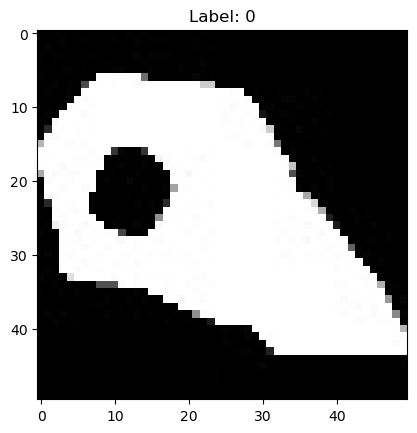

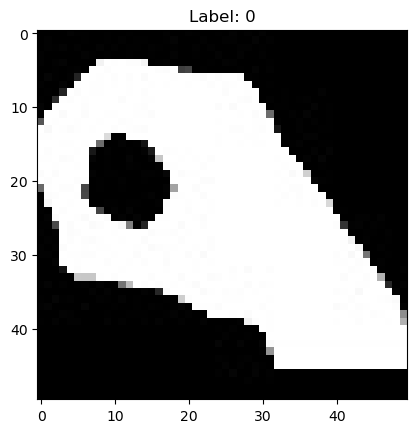

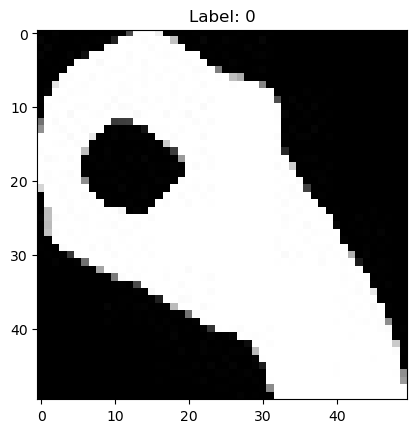

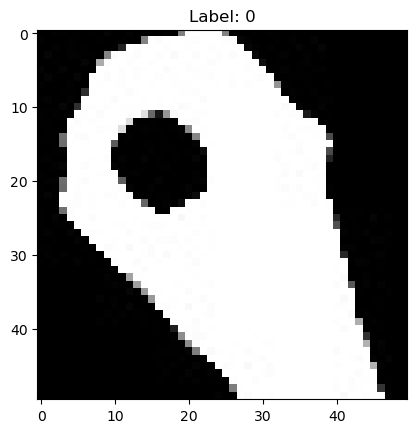

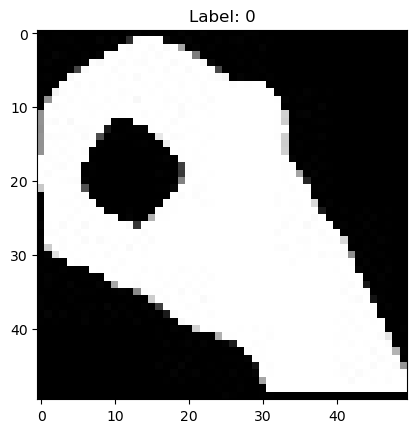

In [3]:
# Set the path to the directory containing the folders
data_directory = 'train/train/'
test_directory = 'test/test/'

# List all subdirectories (each representing a hand sign signal class)
class_directories = [d for d in os.listdir(data_directory) if os.path.isdir(os.path.join(data_directory, d))]
test_directories = [d for d in os.listdir(test_directory) if os.path.isdir(os.path.join(test_directory, d))]

# Create a list to store images and their corresponding labels
images = []
labels = []

# Save all images into the dataset dictionary
for class_folder_number in class_directories:
    class_path = os.path.join(data_directory, class_folder_number)
    
    image_files = glob.glob(os.path.join(class_path, '*.jpg'))
    
    # Take only half of the images
    # image_files = np.random.choice(image_files, size=len(image_files)//2, replace=False)
    image_files = np.random.choice(image_files, size=int(len(image_files)//1.5), replace=False)
    
    for image_path in image_files:
        # Open and resize the image (adjust as needed)
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        # Append the image and label to the lists
        images.append(image)
        labels.append(class_folder_number)

for class_folder_number in test_directories:
    class_path = os.path.join(test_directory, class_folder_number)
    
    image_files = glob.glob(os.path.join(class_path, '*.jpg'))
    
    # Take only half of the images
    # image_files = np.random.choice(image_files, size=len(image_files)//2, replace=False)
    image_files = np.random.choice(image_files, size=int(len(image_files)//1.5), replace=False)
    
    for image_path in image_files:
        # Open and resize the image (adjust as needed)
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        # Append the image and label to the lists
        images.append(image)
        labels.append(class_folder_number)
        
# Create a DataFrame
df = pd.DataFrame({'Image': images, 'Label': labels})

print(len(df))

# Display the first few images
num_images_to_display = 5
for i in range(num_images_to_display):
    plt.imshow(df['Image'][i])
    plt.title(f"Label: {df['Label'][i]}")
    plt.show()

Preprocess Data

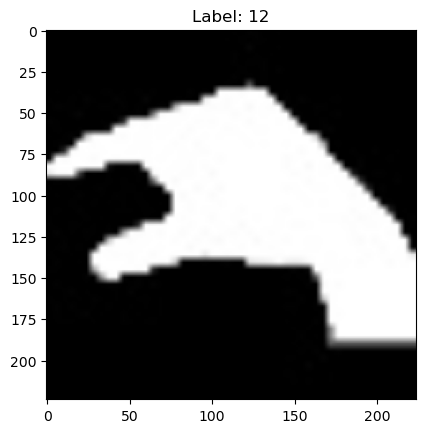

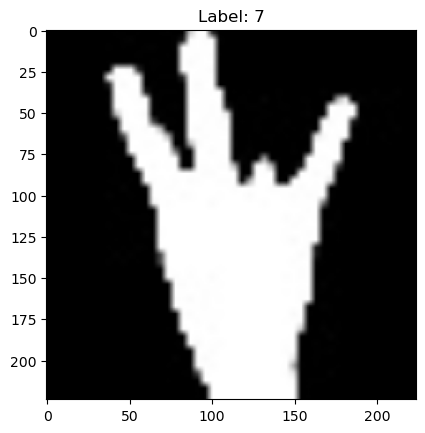

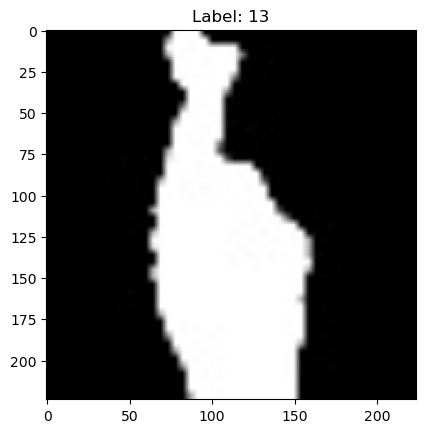

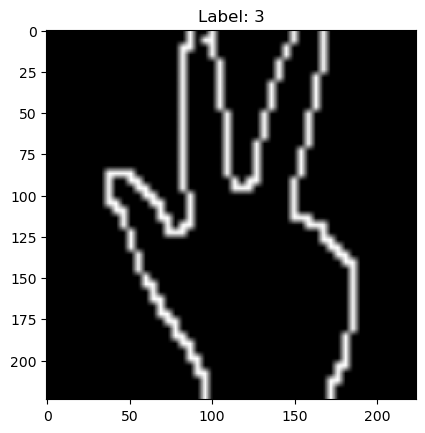

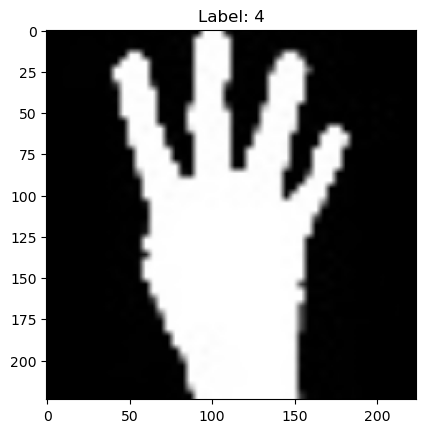

...

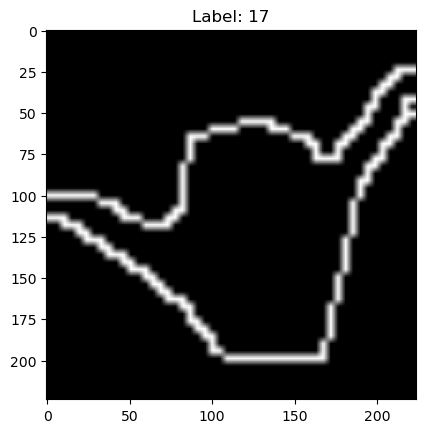

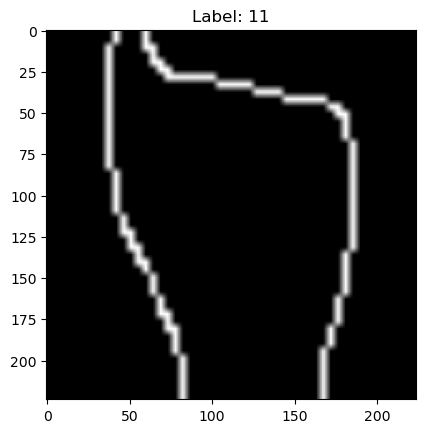

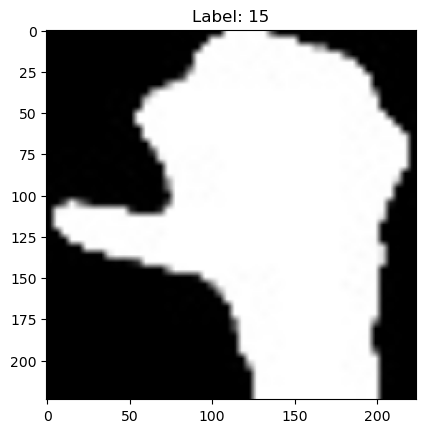

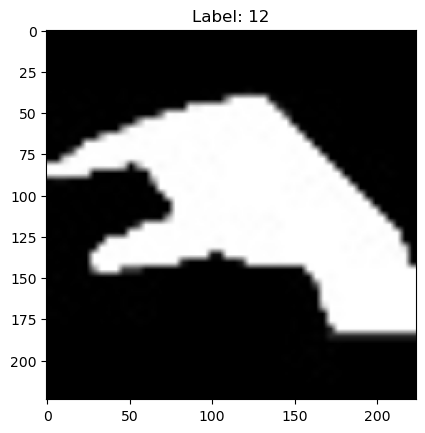

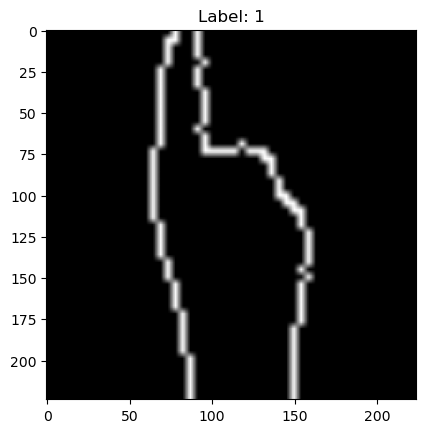

In [4]:
def preprocess_image(image, data_augmentation=False):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply GaussianBlur to reduce noise and improve edge detection
    image = cv2.GaussianBlur(image, (5, 5), 0)

    # Perform Canny edge detection
    image = cv2.Canny(image, 250, 255)
    
    # # Expand dimensions for data augmentation
    # image = np.expand_dims(image, axis=-1)
    # # Apply data augmentation if specified
    # if data_augmentation:
    #     datagen = ImageDataGenerator(
    #         rotation_range=20
    #     )

    #     image = datagen.random_transform(image)
    # # Squeeze dimensions back to (224, 224)
    # image = np.squeeze(image)
    
    image = cv2.resize(image, (224, 224))
    
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    
    return image

# divide dataset into 2 type of preproccessing, one normal and one edge
def preprocess_image_normal(image, data_augmentation=False):
    image = cv2.resize(image, (224, 224))
    
    return image

random_indices = np.random.choice(len(df), len(df) // 2, replace=False)
df['Preprocessed_Image'] = df.apply(lambda row: preprocess_image(row['Image'], data_augmentation=True) if row.name in random_indices else preprocess_image_normal(row['Image'], data_augmentation=True), axis=1)
# df['Preprocessed_Image'] = df['Image'].apply(lambda img: preprocess_image_normal(img, data_augmentation=True))

# Display random 10 images
num_images_to_display = 20
random_indices = np.random.choice(len(df), num_images_to_display, replace=False)

for idx in random_indices:
    plt.imshow(df['Preprocessed_Image'][idx])
    plt.title(f"Label: {df['Label'][idx]}")
    plt.show()

Split the data

In [5]:
x = np.stack(df['Preprocessed_Image'].values)
y = df['Label'].values.astype(int)

# Split into train, validation, and test sets 60/20/20
x_train, x_temp, y_train, y_temp = train_test_split(x, y, test_size=0.4, random_state=42)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42)
# Further split validation set into validation and test sets
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42)

batch_size = 32

train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=len(x_train)).batch(batch_size)

val_dataset = tf.data.Dataset.from_tensor_slices((x_val, y_val))
val_dataset = val_dataset.batch(batch_size)

test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))
test_dataset = test_dataset.batch(batch_size)

del x, y, x_train, y_train, x_val, y_val, x_test, y_test

Use ResNet50 Model for classification task

In [7]:
num_classes = df["Label"].nunique()  # Number of unique labels in your dataset

# Load the pre-trained ResNet50 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(num_classes, activation='softmax'))  # Adjust num_classes based on your dataset

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

num_epochs = 10

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(train_dataset, epochs=num_epochs, validation_data=val_dataset)

# Evaluate the model
model.evaluate(test_dataset)

Epoch 1/10
300/300 [==============================] - 27s 59ms/step - loss: 0.8734 - accuracy: 0.8768 - val_loss: 0.2226 - val_accuracy: 0.9925
Epoch 2/10
300/300 [==============================] - 17s 55ms/step - loss: 0.1831 - accuracy: 0.9898 - val_loss: 0.0894 - val_accuracy: 0.9969
Epoch 3/10
300/300 [==============================] - 17s 56ms/step - loss: 0.0996 - accuracy: 0.9947 - val_loss: 0.0518 - val_accuracy: 0.9981
Epoch 4/10
300/300 [==============================] - 17s 56ms/step - loss: 0.0667 - accuracy: 0.9962 - val_loss: 0.0353 - val_accuracy: 0.9991
Epoch 5/10
300/300 [==============================] - 17s 56ms/step - loss: 0.0490 - accuracy: 0.9965 - val_loss: 0.0258 - val_accuracy: 0.9994
Epoch 6/10
300/300 [==============================] - 17s 57ms/step - loss: 0.0371 - accuracy: 0.9977 - val_loss: 0.0195 - val_accuracy: 0.9997
Epoch 7/10
300/300 [==============================] - 17s 57ms/step - loss: 0.0306 - accuracy: 0.9974 - val_loss: 0.0153 - val_accuracy:

[0.009243195876479149, 0.9996874928474426]

Save Model

In [8]:
# model.summary()
# save_model(model, 'hand_gesture3.keras')
# model.save_weights('hand_gesture3.weights.h5')

Try the model on the camera

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


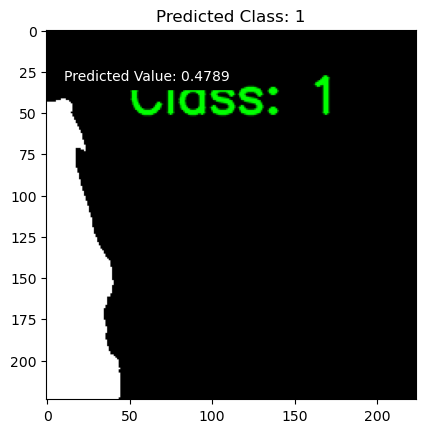

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


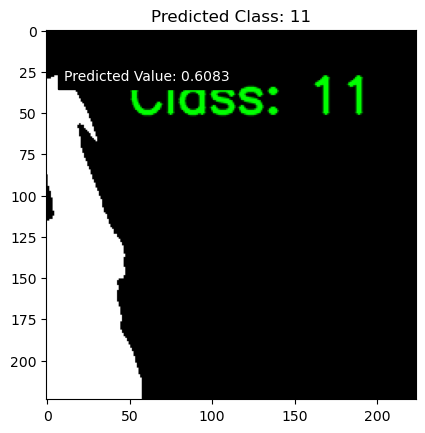

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


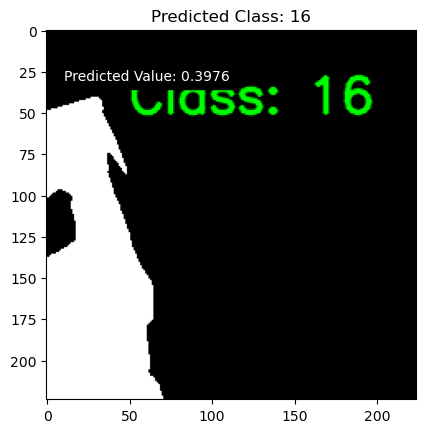

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


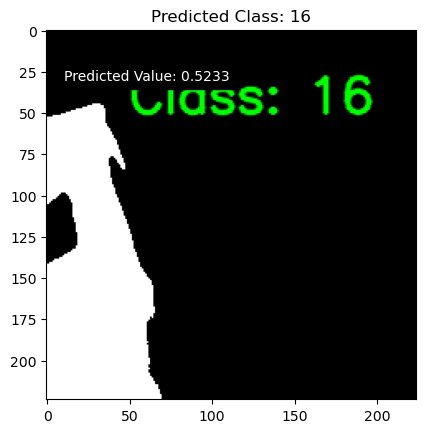

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


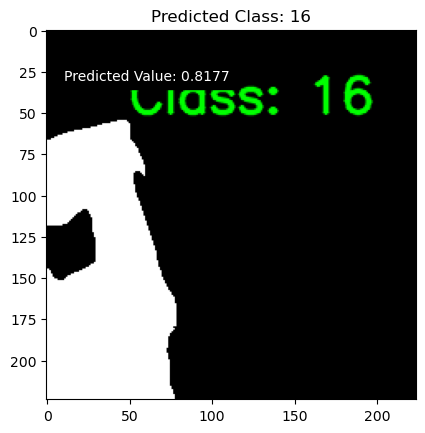

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


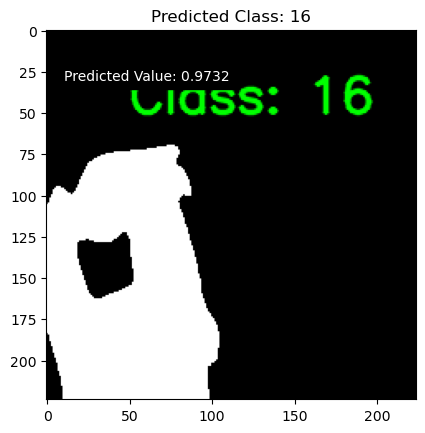

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


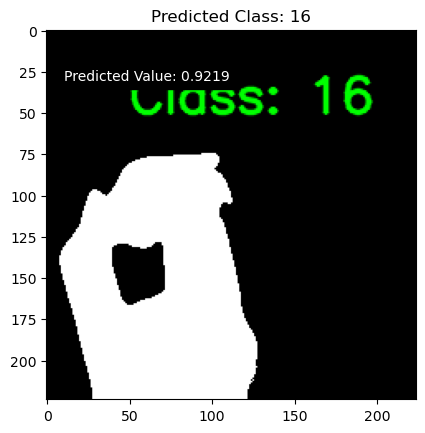

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


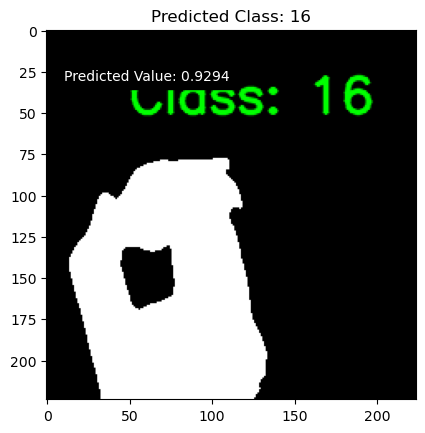

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


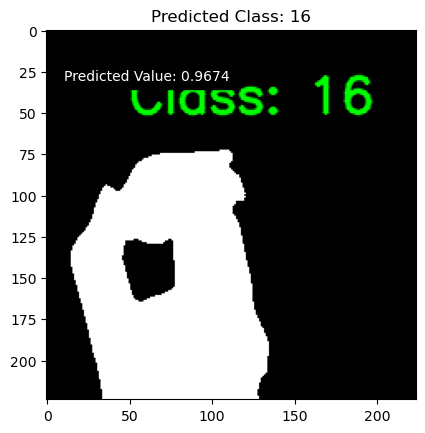

Hand detecting for prediction
1/1 [==============================] - 0s 20ms/step


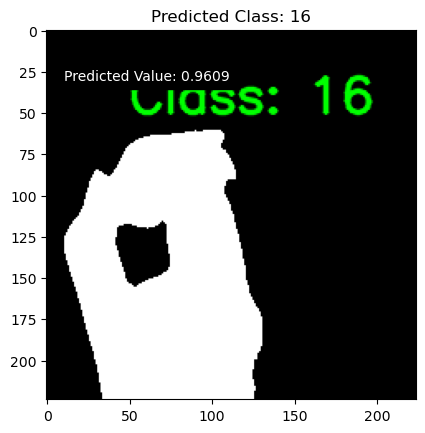

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


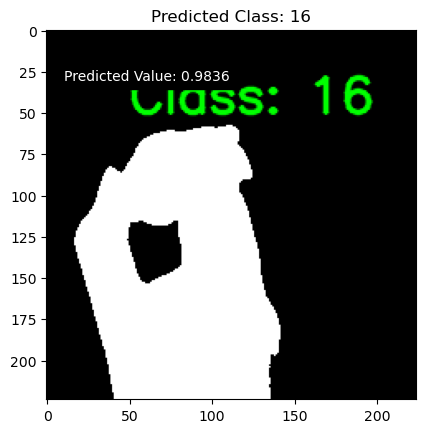

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


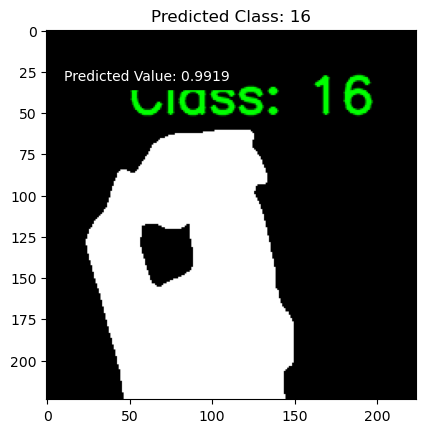

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


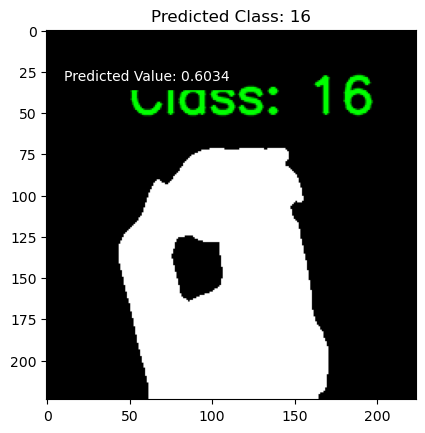

Hand detecting for prediction
1/1 [==============================] - 0s 20ms/step


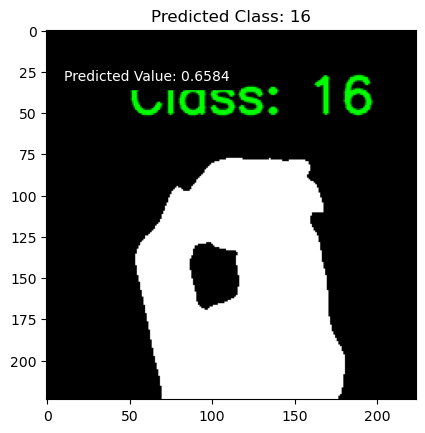

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


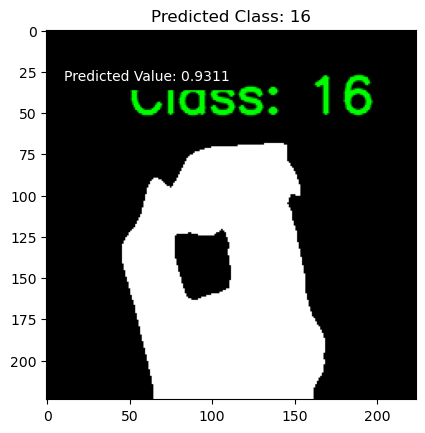

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


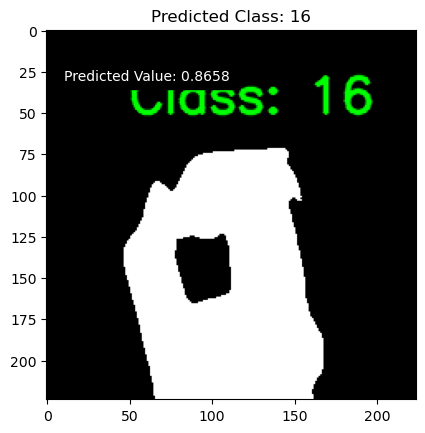

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


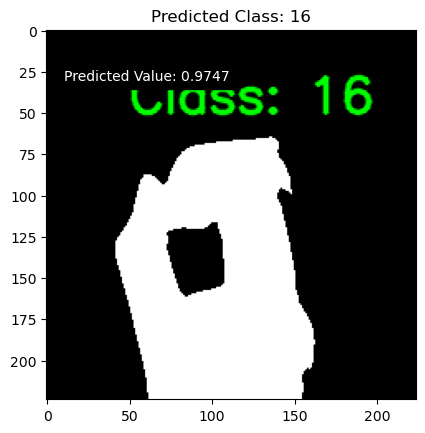

Hand detecting for prediction
1/1 [==============================] - 0s 20ms/step


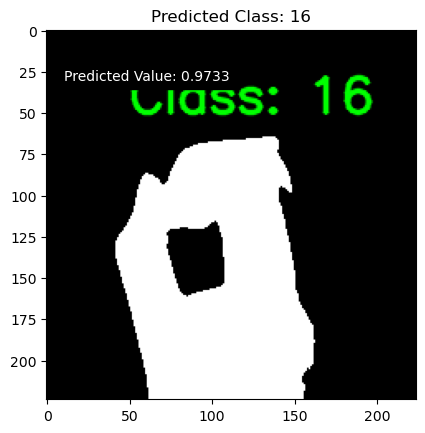

Hand detecting for prediction
1/1 [==============================] - 0s 21ms/step


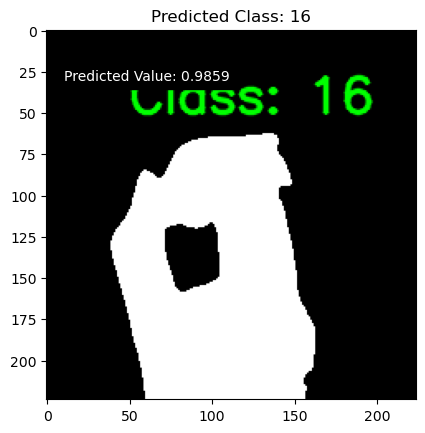

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


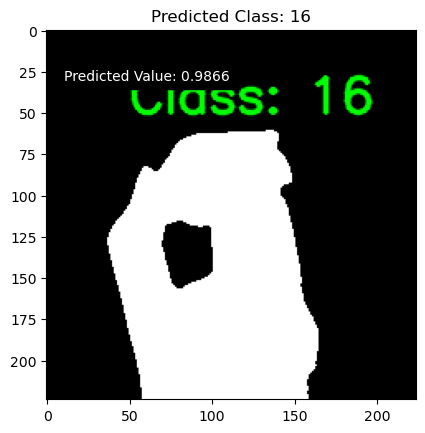

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


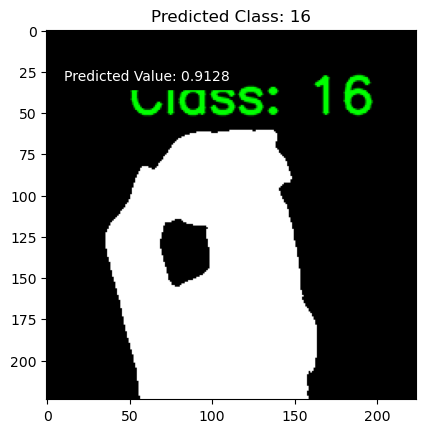

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


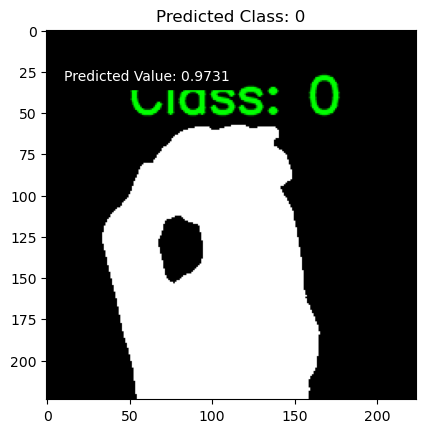

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


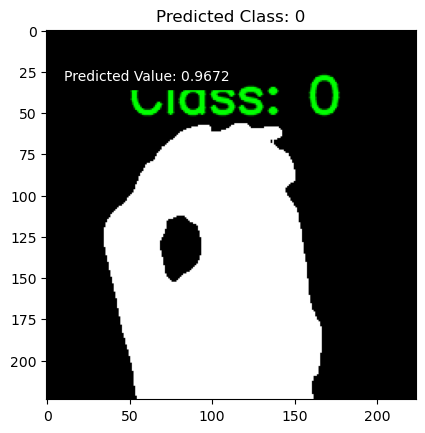

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


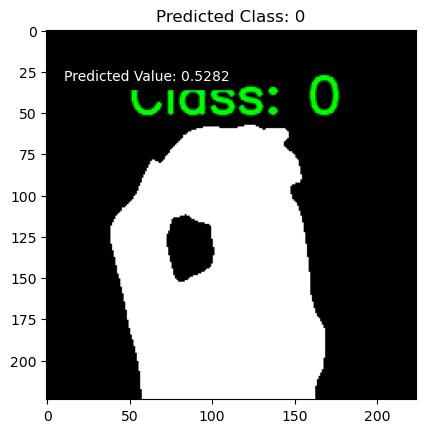

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


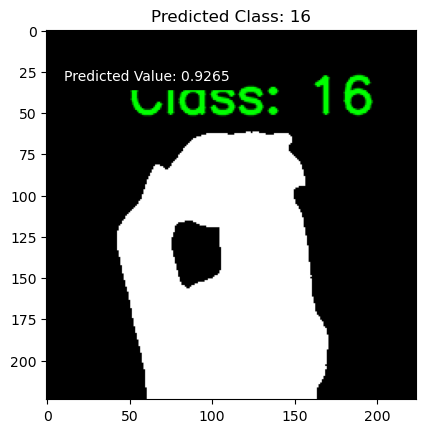

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


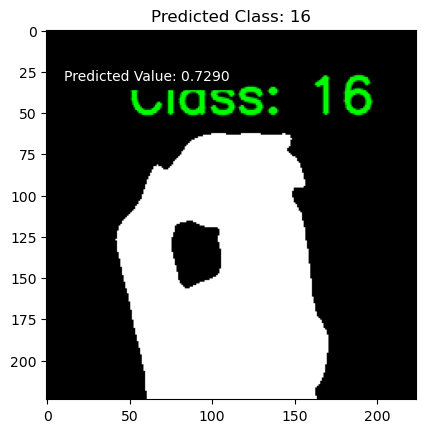

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


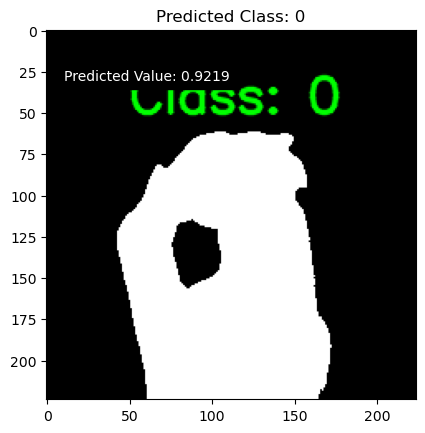

Hand detecting for prediction
1/1 [==============================] - 0s 35ms/step


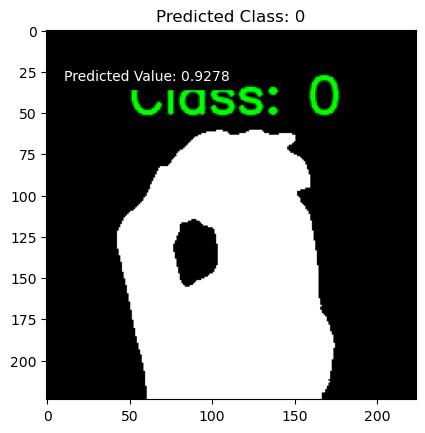

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


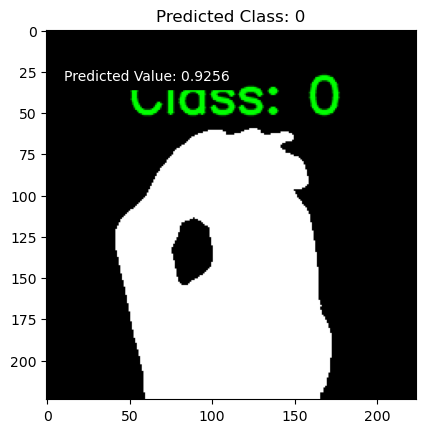

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


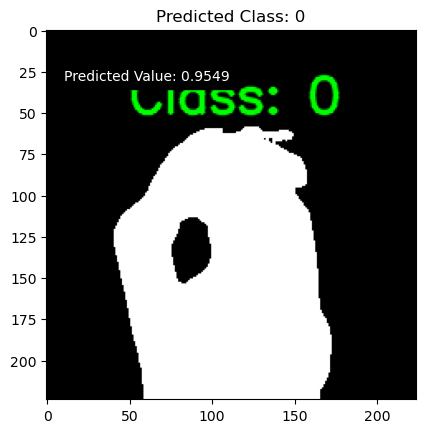

Hand detecting for prediction
1/1 [==============================] - 0s 39ms/step


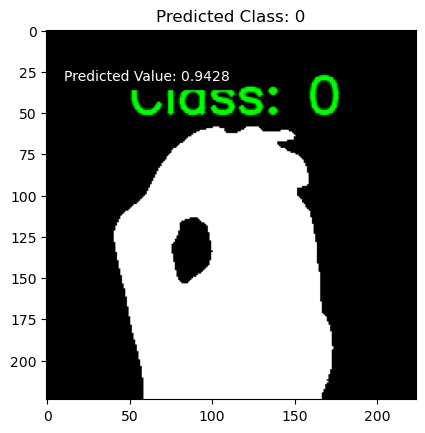

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


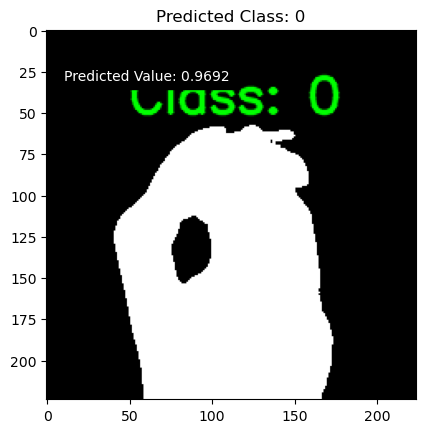

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


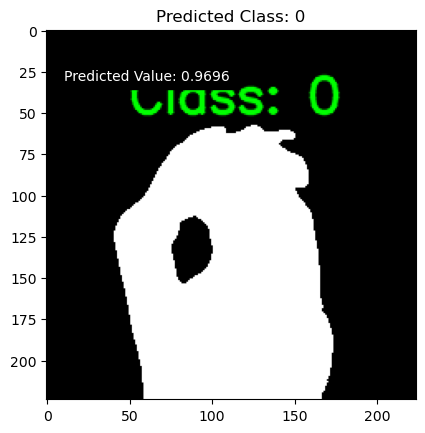

Hand detecting for prediction
1/1 [==============================] - 0s 32ms/step


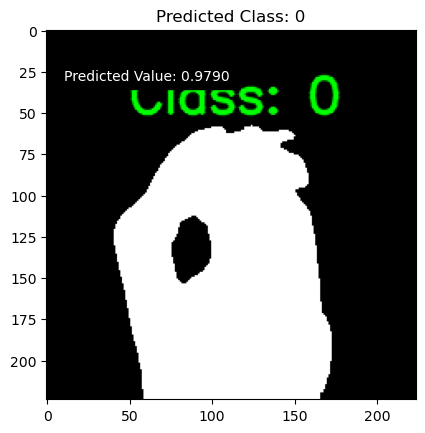

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


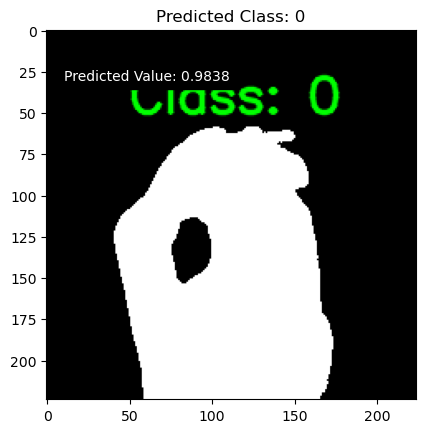

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


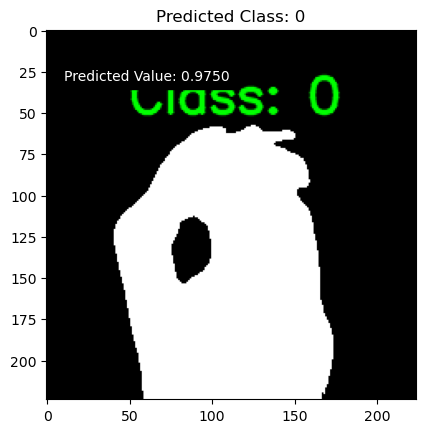

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


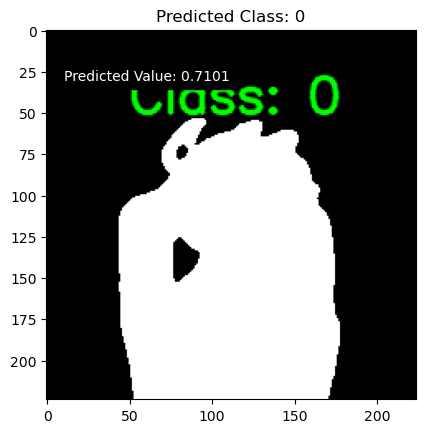

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


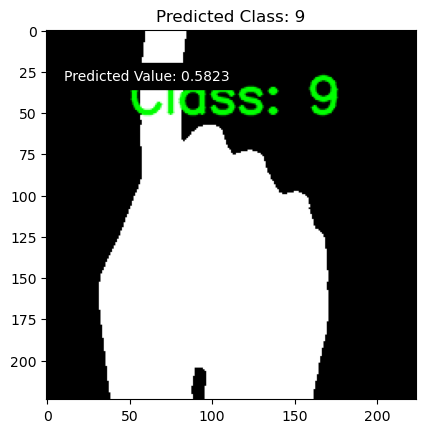

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


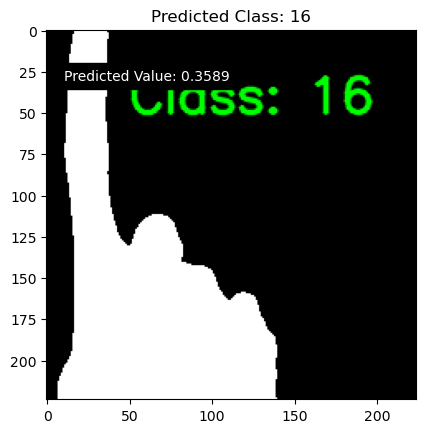

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


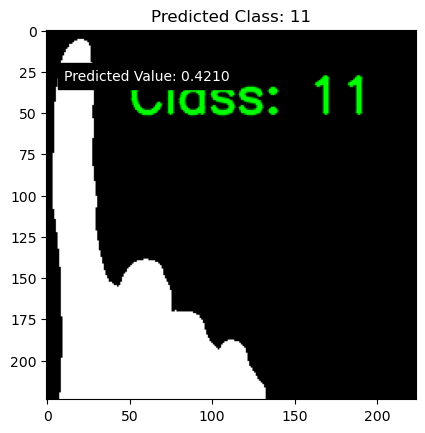

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


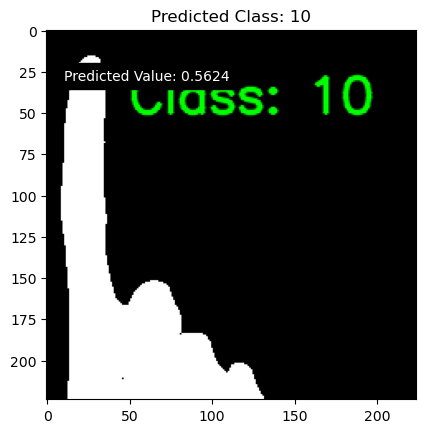

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


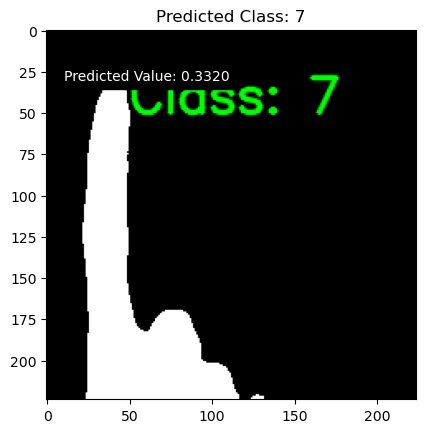

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


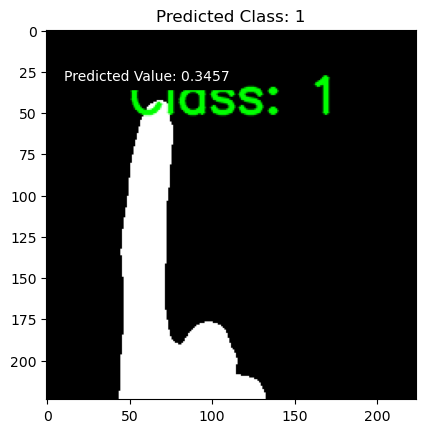

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


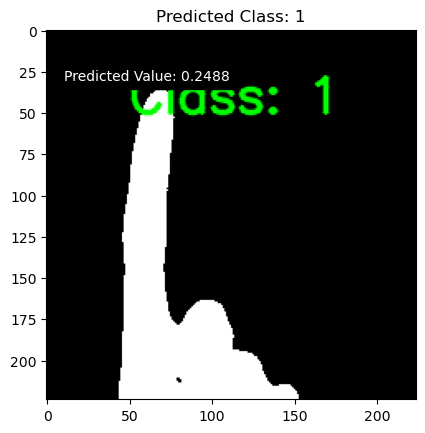

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


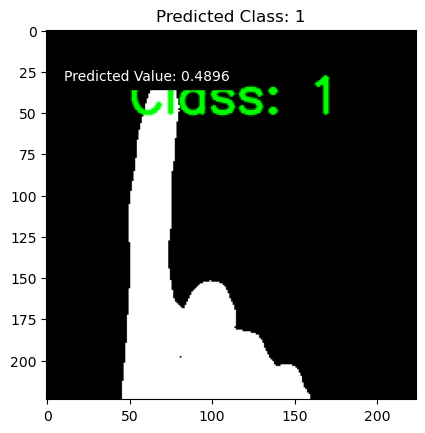

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


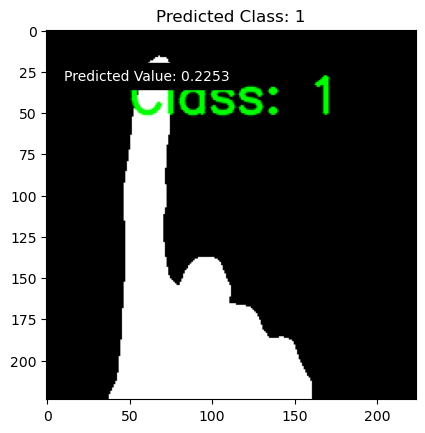

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


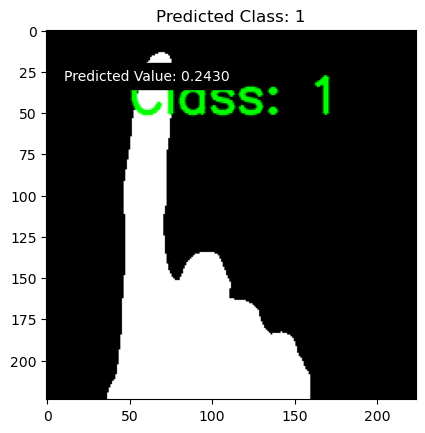

Hand detecting for prediction
1/1 [==============================] - 0s 66ms/step


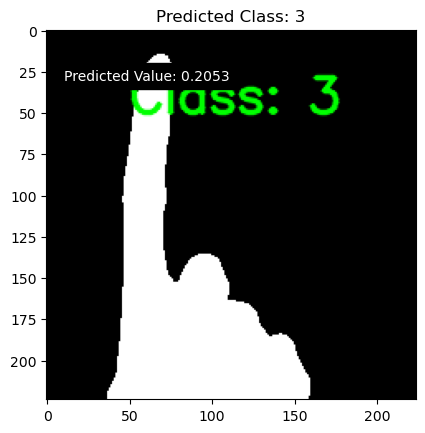

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


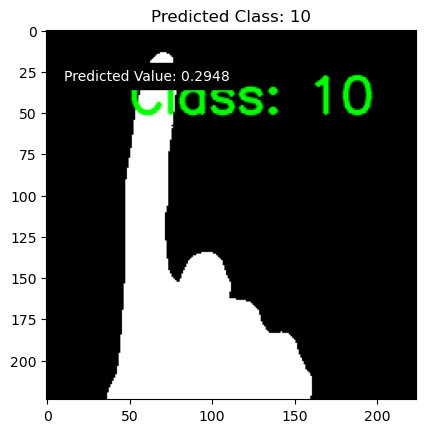

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


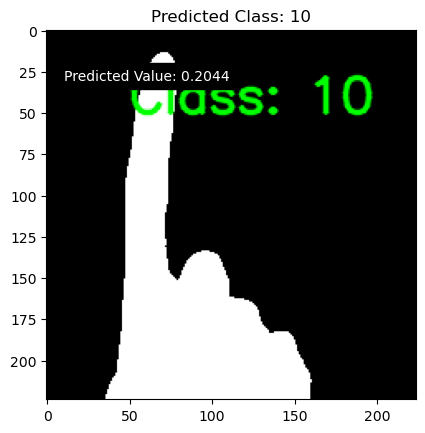

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


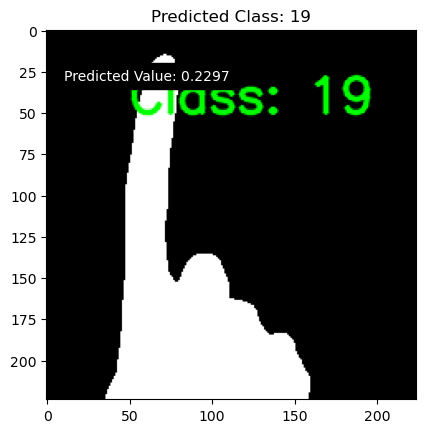

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


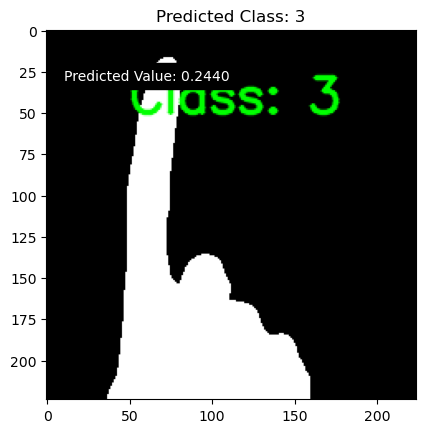

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


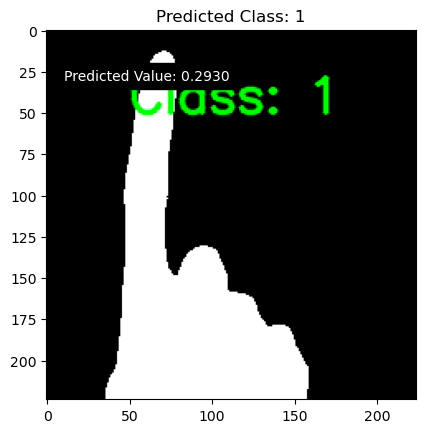

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


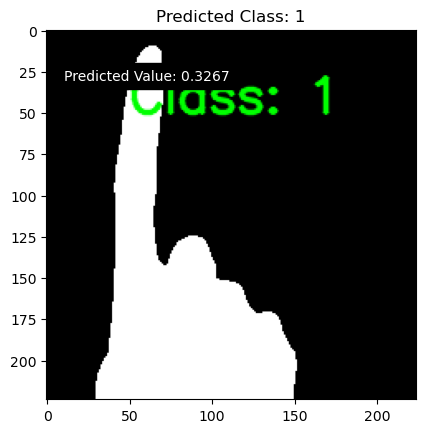

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


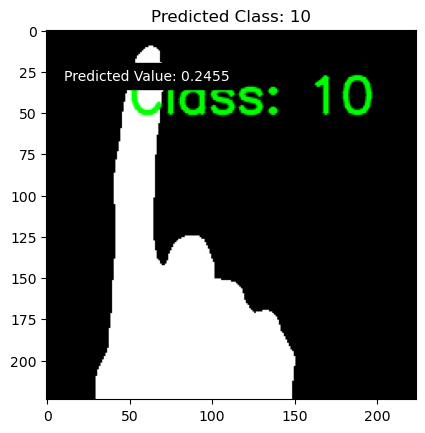

Hand detecting for prediction
1/1 [==============================] - 0s 35ms/step


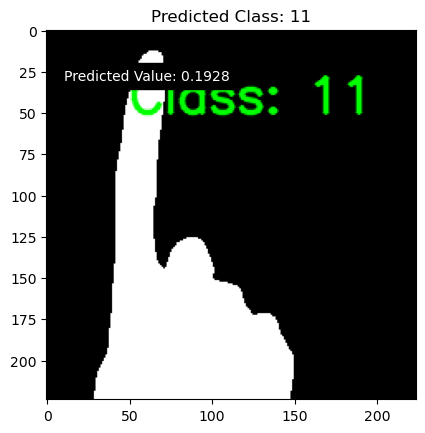

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


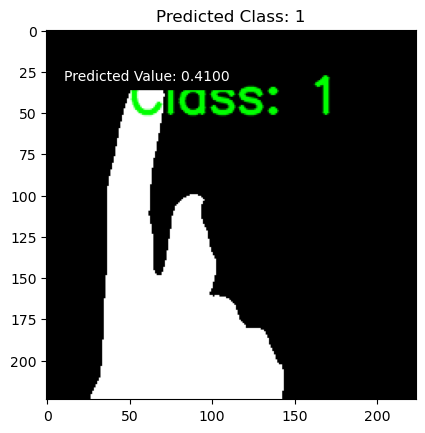

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


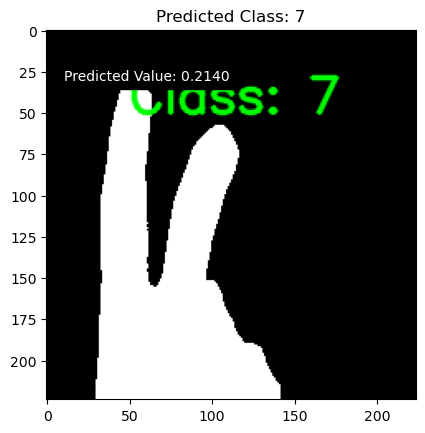

Hand detecting for prediction
1/1 [==============================] - 0s 34ms/step


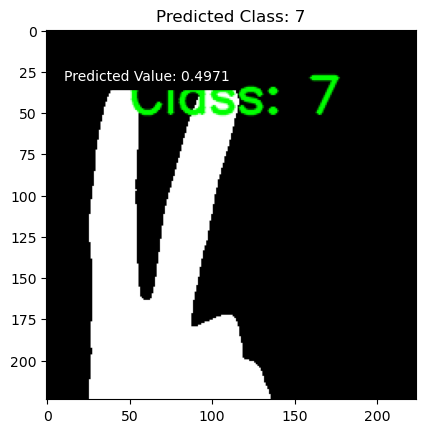

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


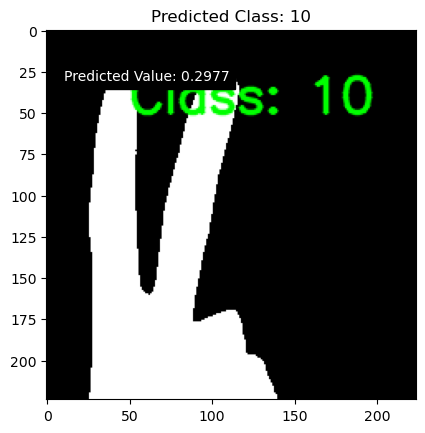

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


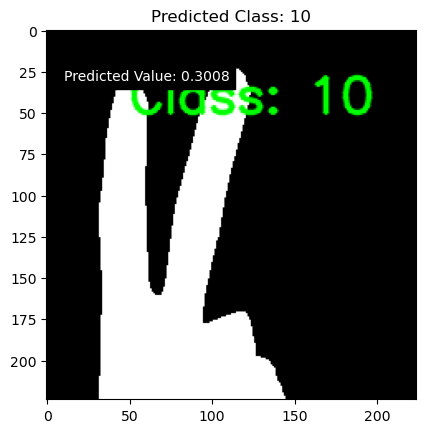

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


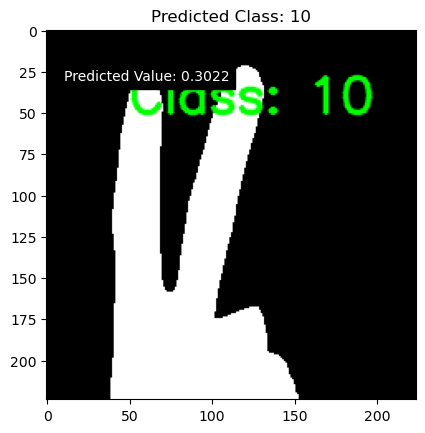

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


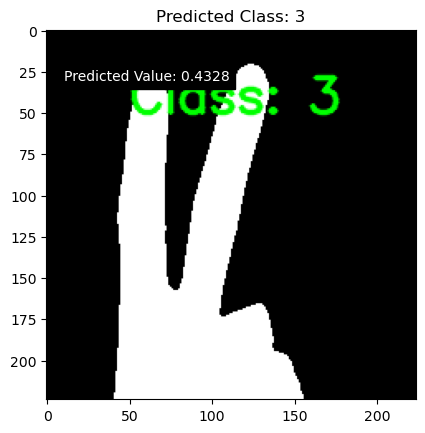

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


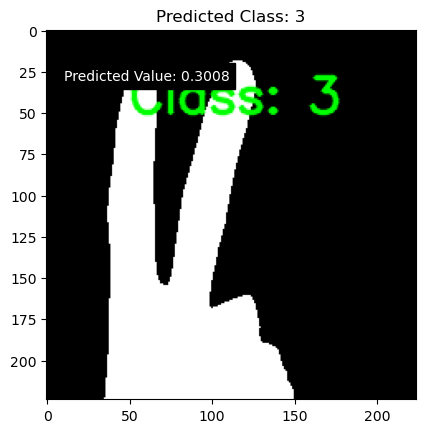

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


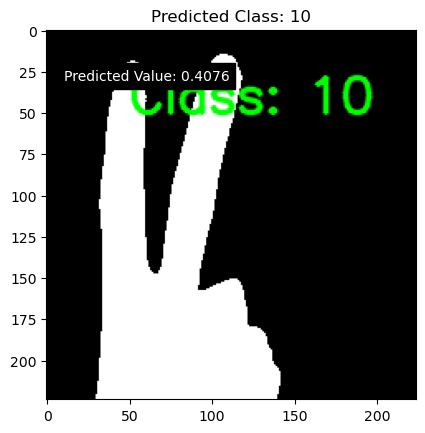

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


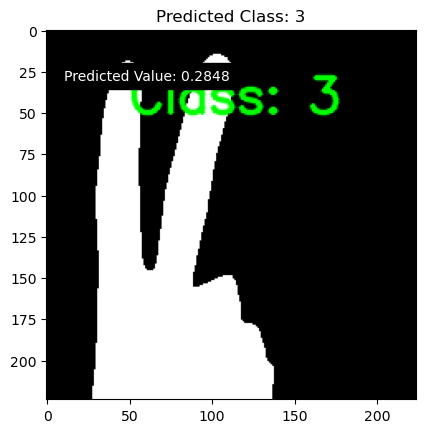

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


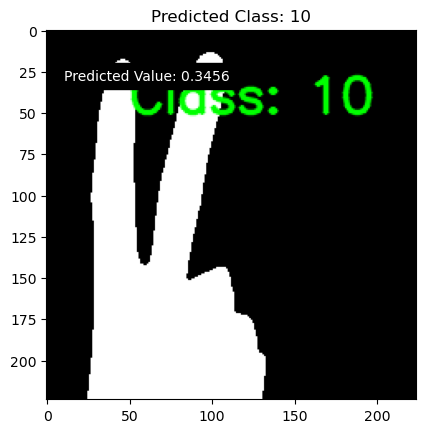

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


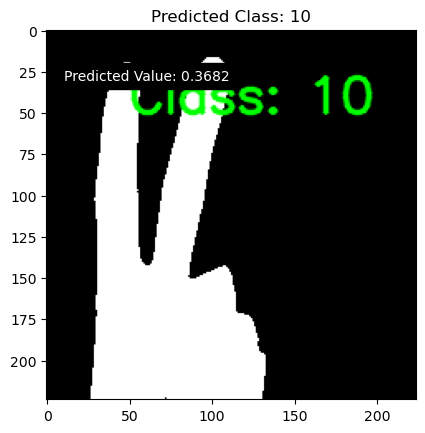

Hand detecting for prediction
1/1 [==============================] - 0s 35ms/step


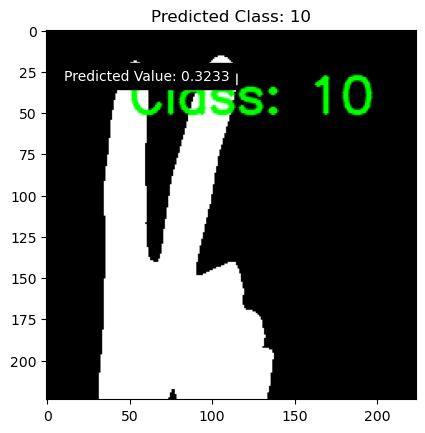

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


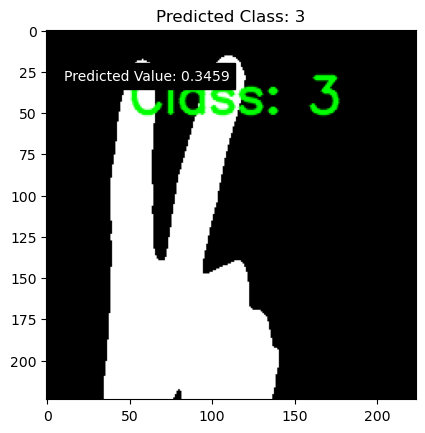

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


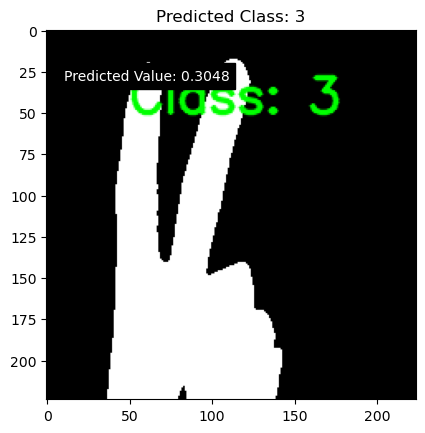

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


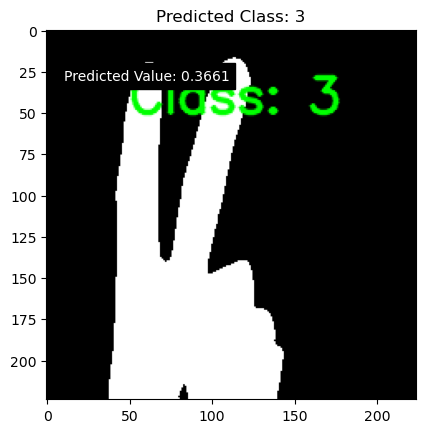

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


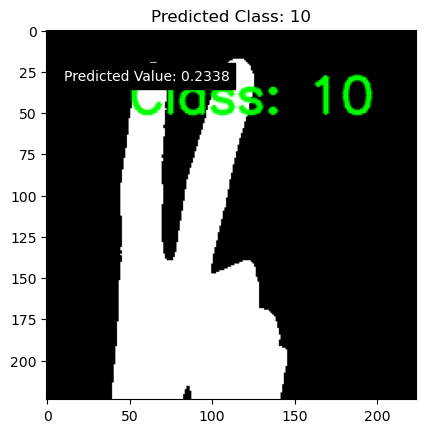

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


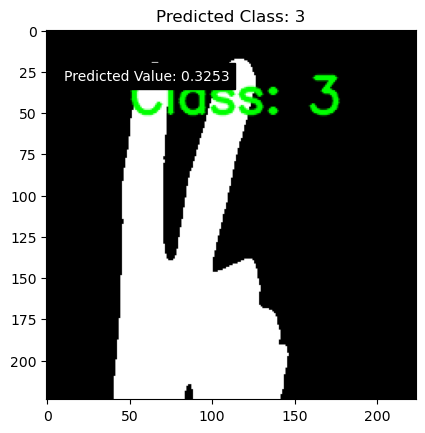

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


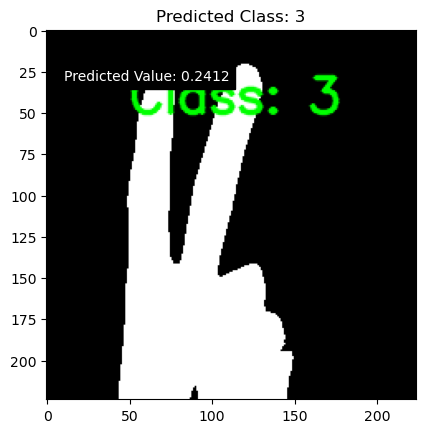

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


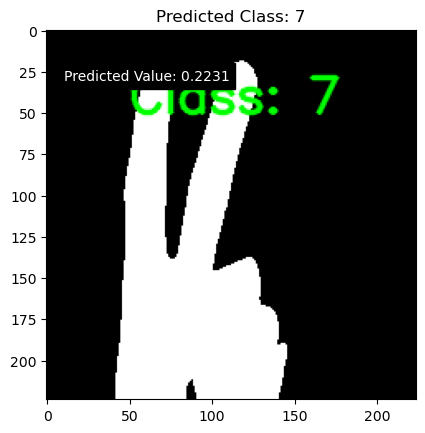

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


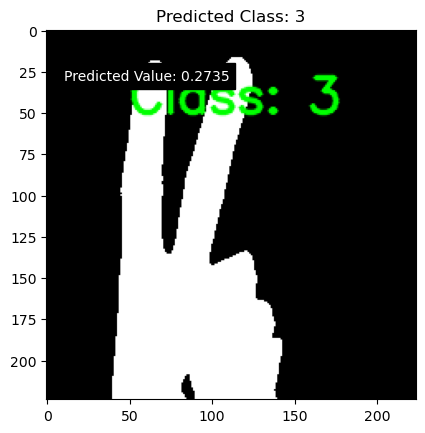

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


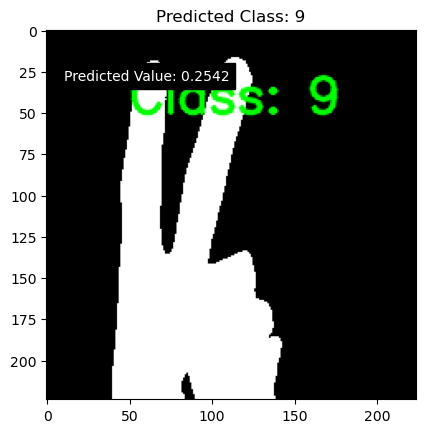

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


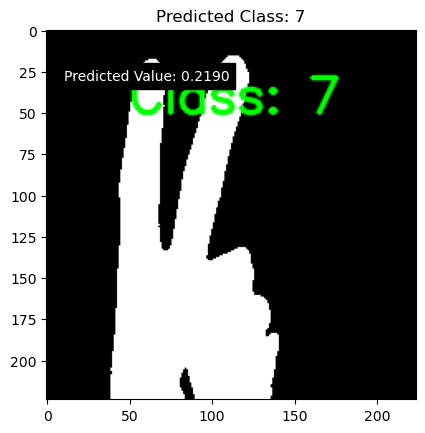

Hand detecting for prediction
1/1 [==============================] - 0s 32ms/step


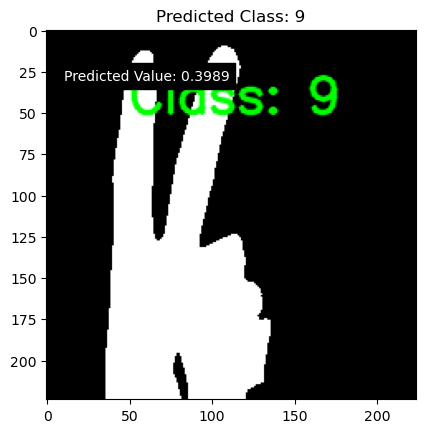

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


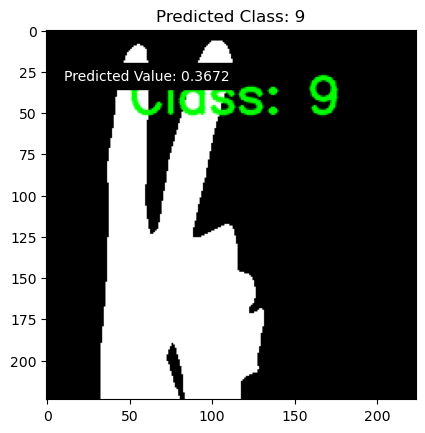

Hand detecting for prediction
1/1 [==============================] - 0s 37ms/step


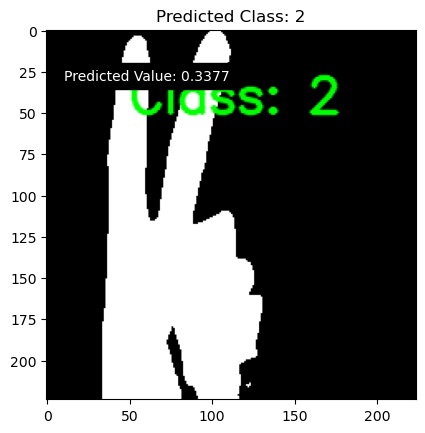

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


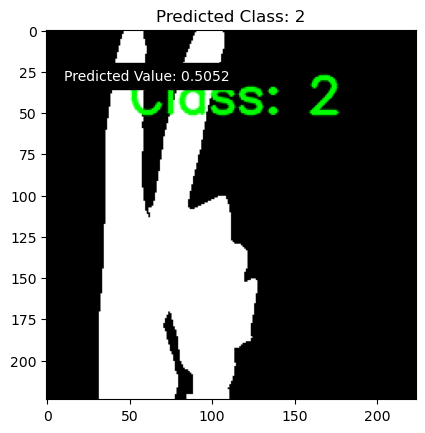

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


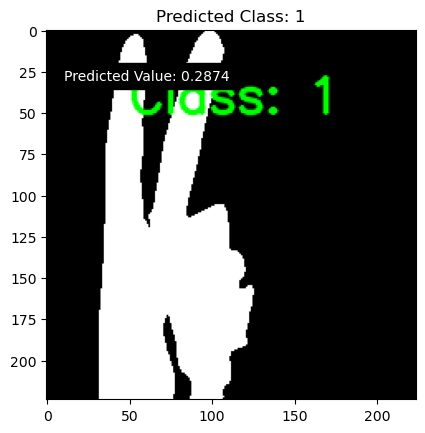

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


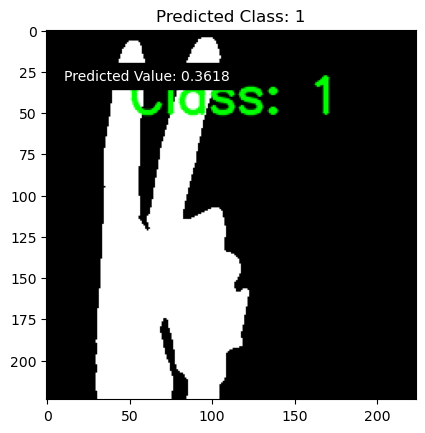

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


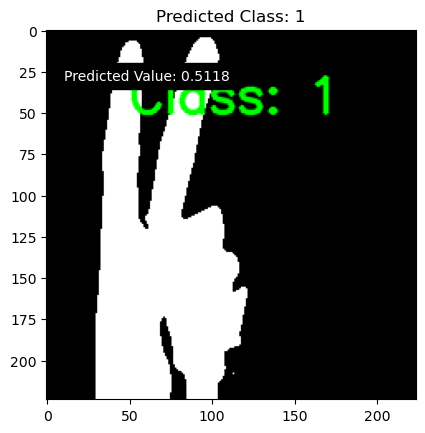

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


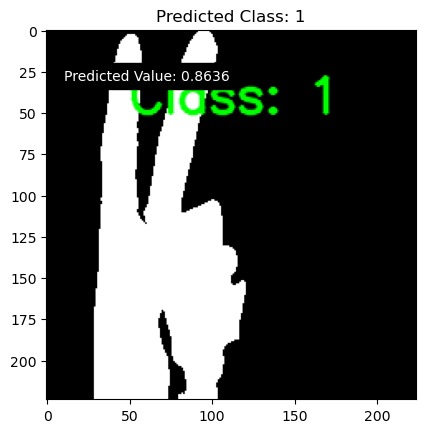

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


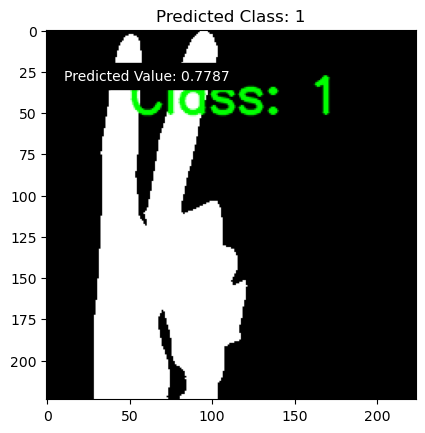

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


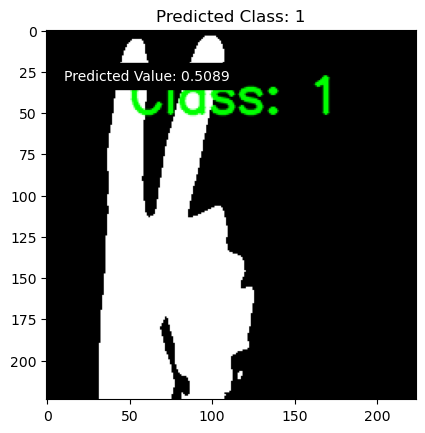

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


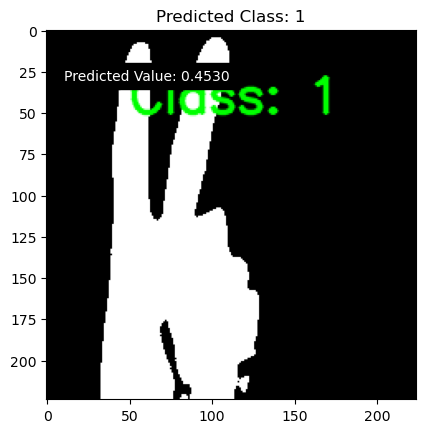

Hand detecting for prediction
1/1 [==============================] - 0s 36ms/step


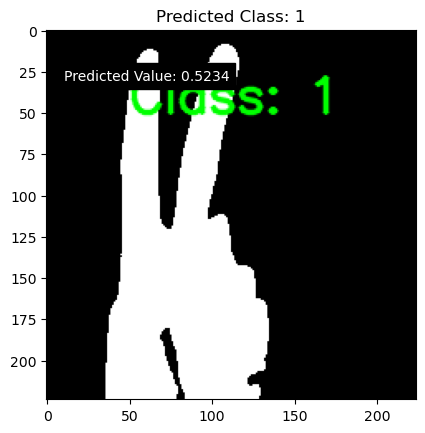

Hand detecting for prediction
1/1 [==============================] - 0s 32ms/step


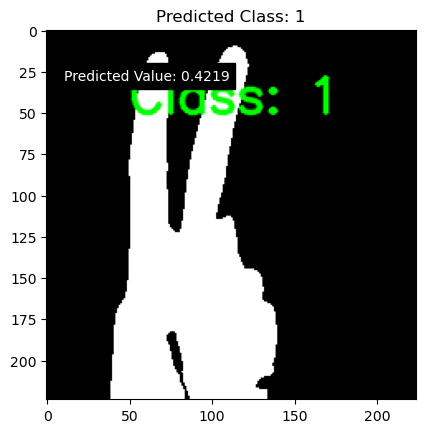

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


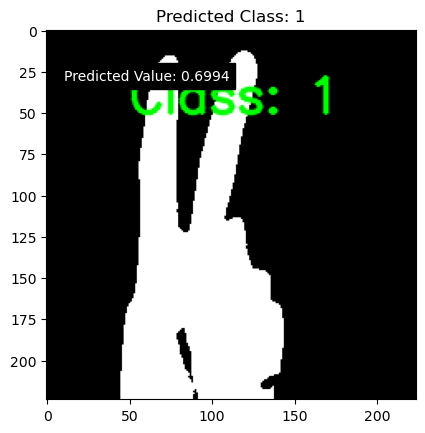

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


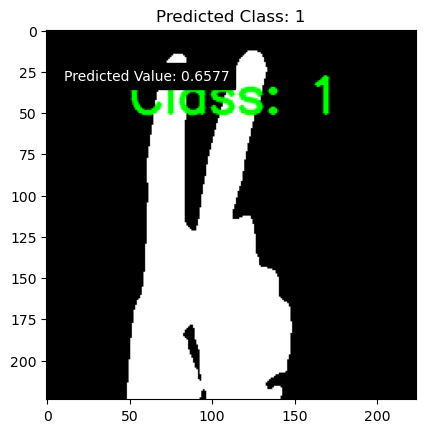

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


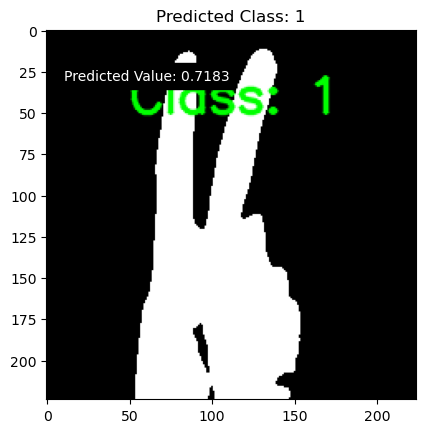

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


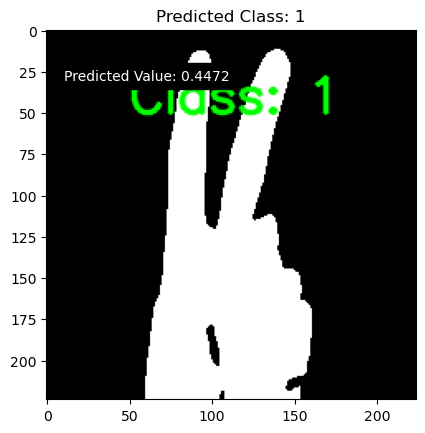

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


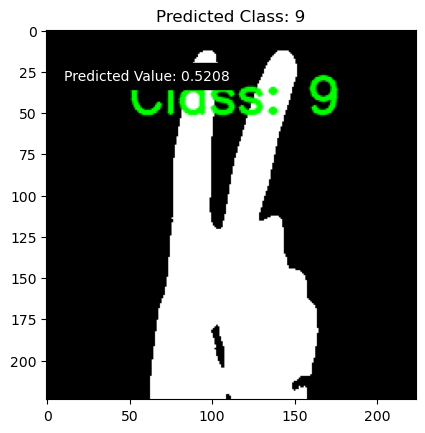

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


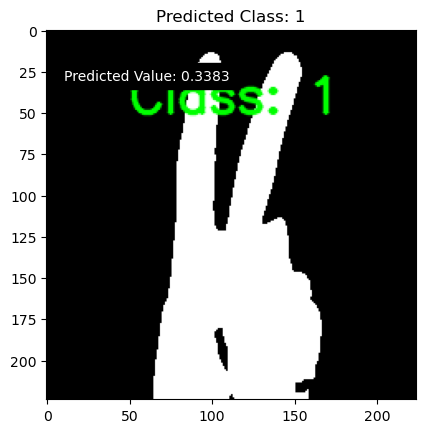

Hand detecting for prediction
1/1 [==============================] - 0s 36ms/step


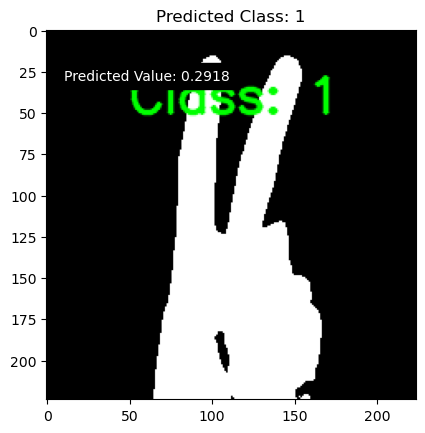

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


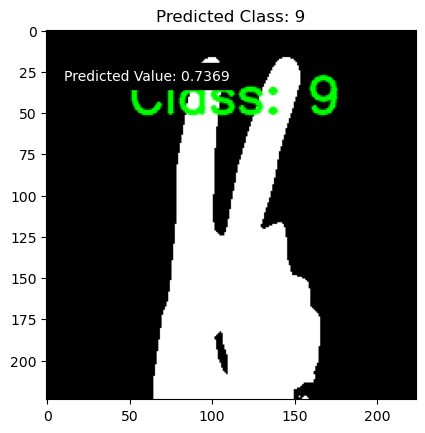

Hand detecting for prediction
1/1 [==============================] - 0s 34ms/step


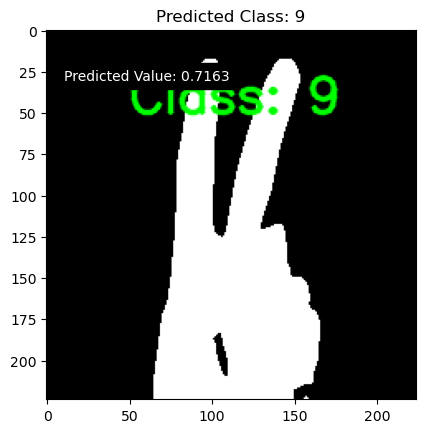

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


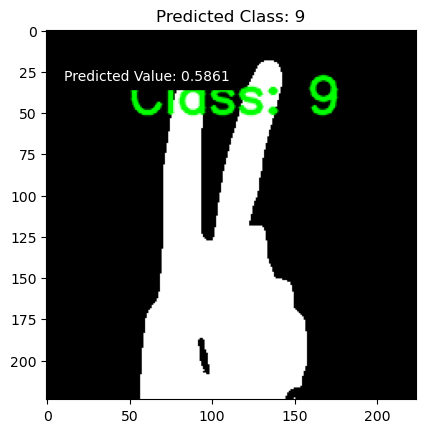

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


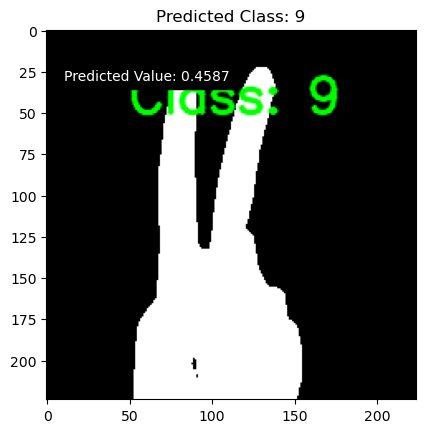

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


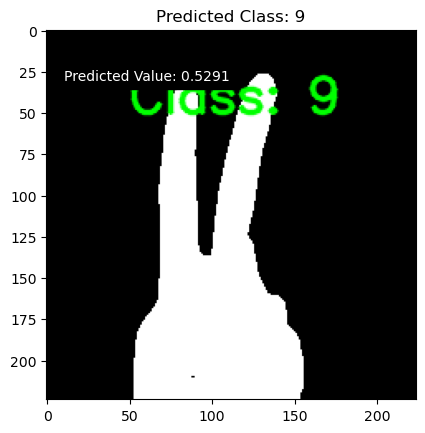

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


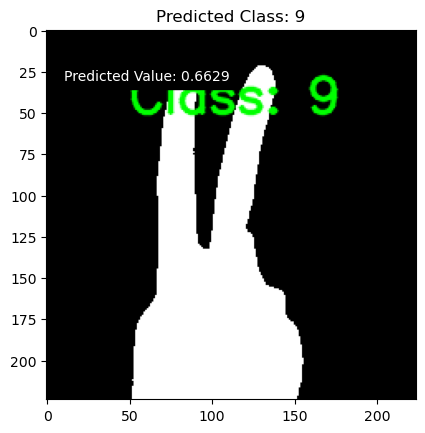

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


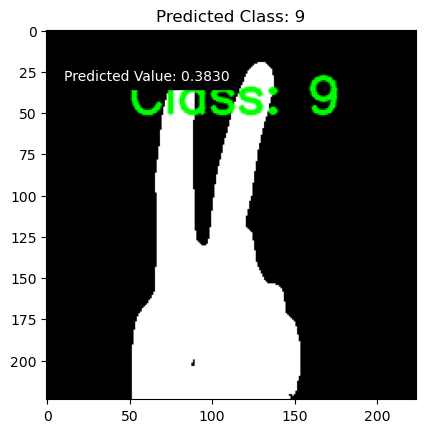

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


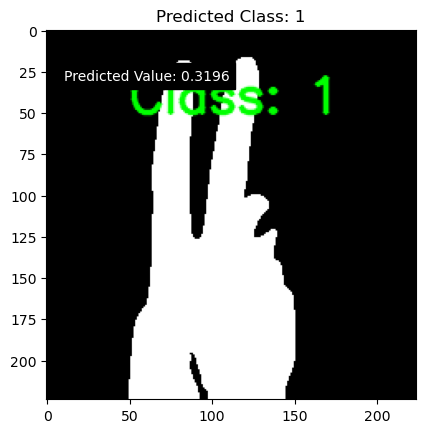

Hand detecting for prediction
1/1 [==============================] - 0s 36ms/step


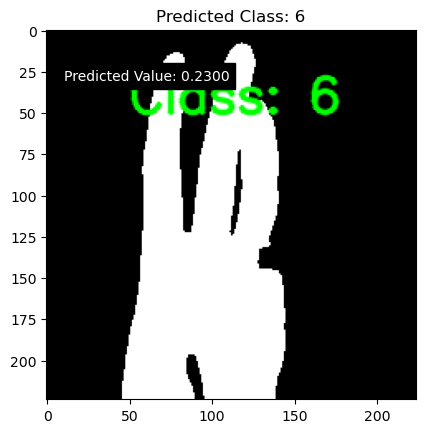

Hand detecting for prediction
1/1 [==============================] - 0s 21ms/step


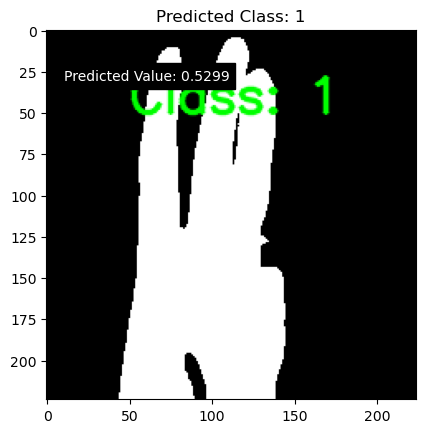

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


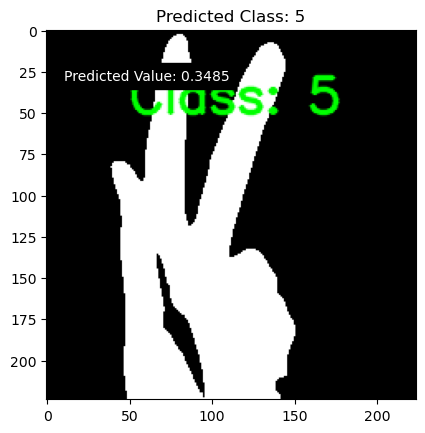

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


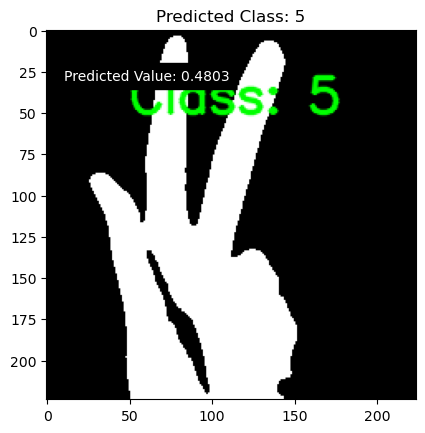

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


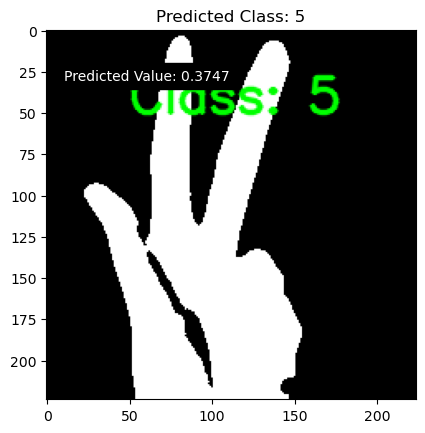

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


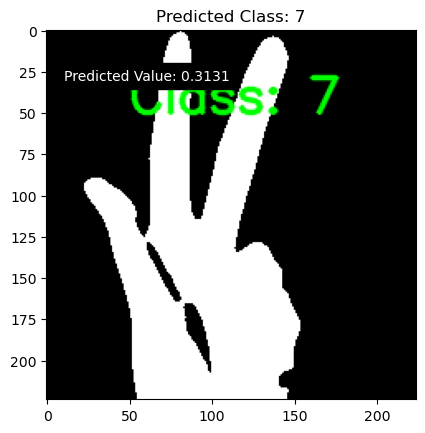

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


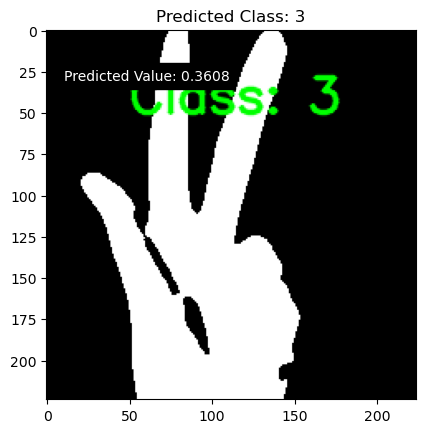

Hand detecting for prediction
1/1 [==============================] - 0s 34ms/step


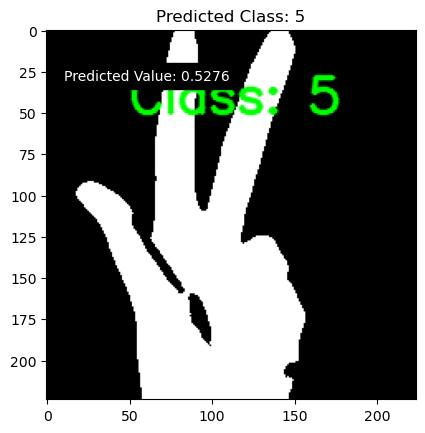

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


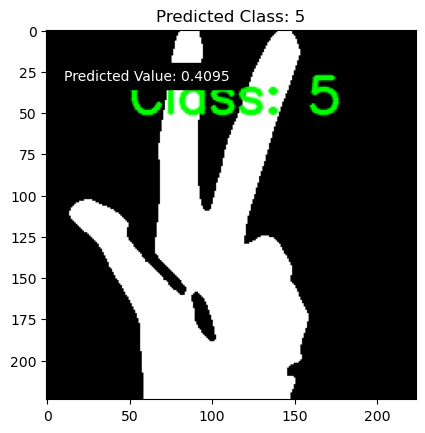

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


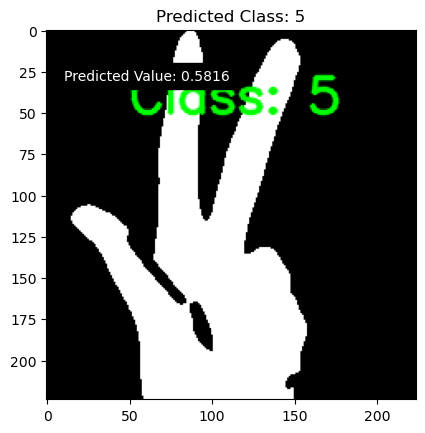

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


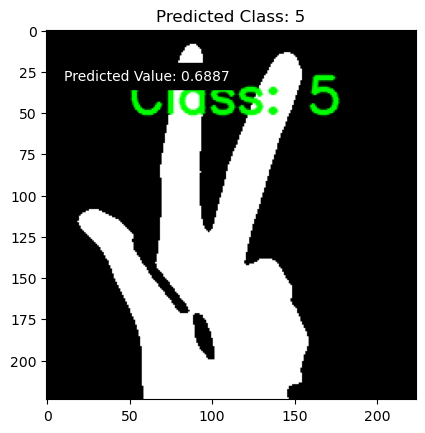

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


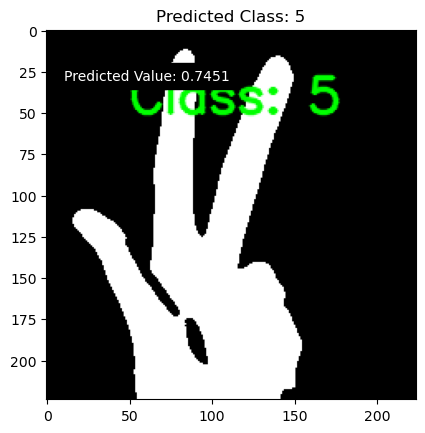

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


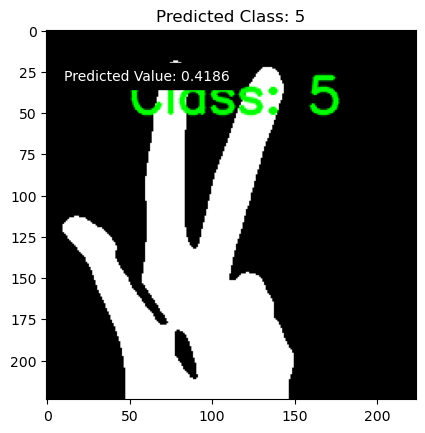

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


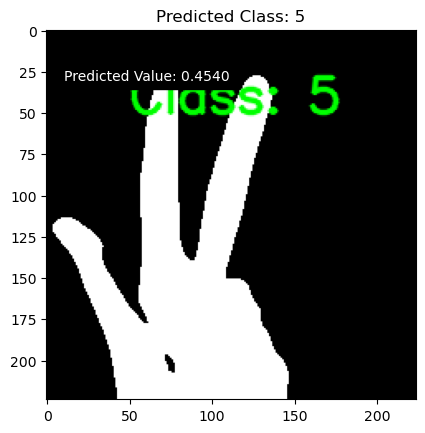

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


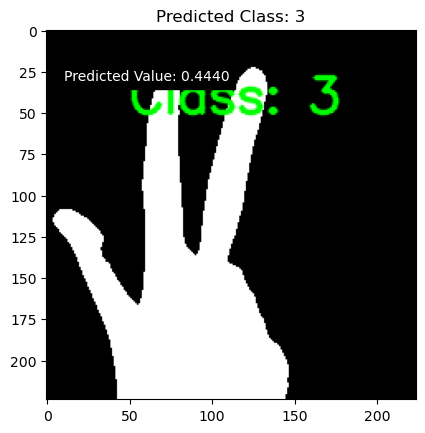

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


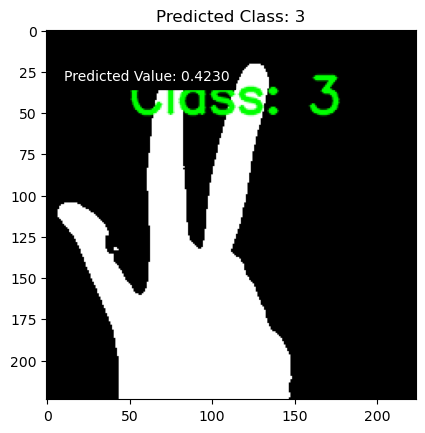

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


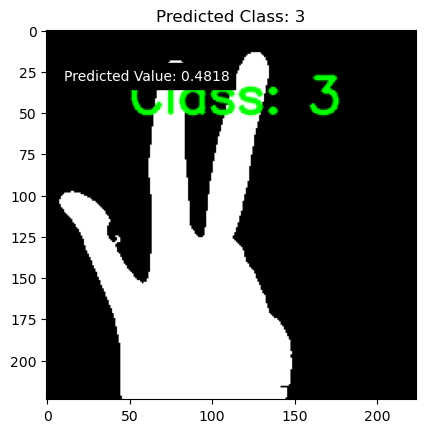

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


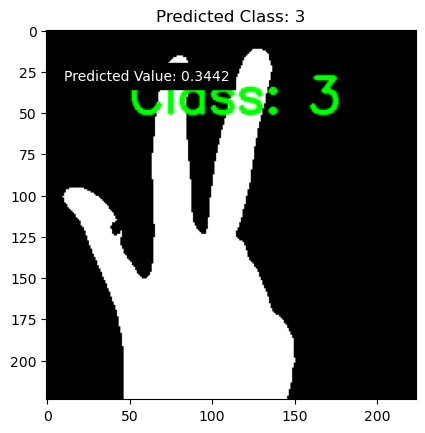

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


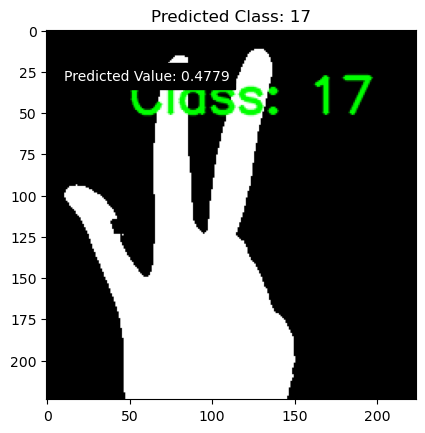

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


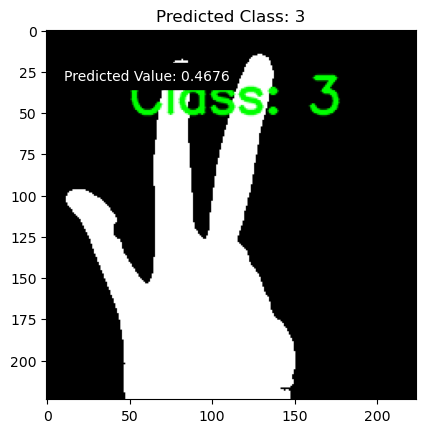

Hand detecting for prediction
1/1 [==============================] - 0s 36ms/step


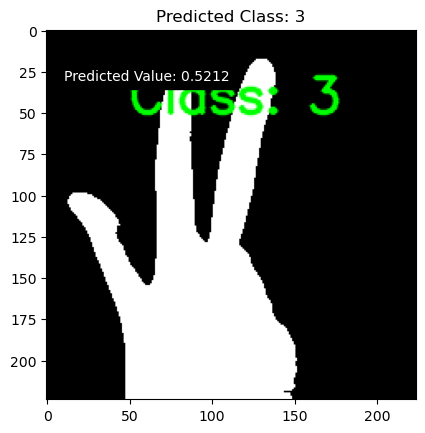

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


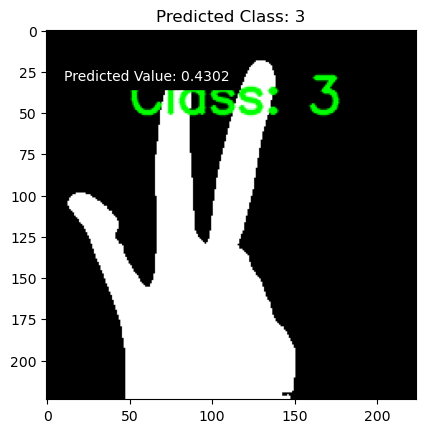

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


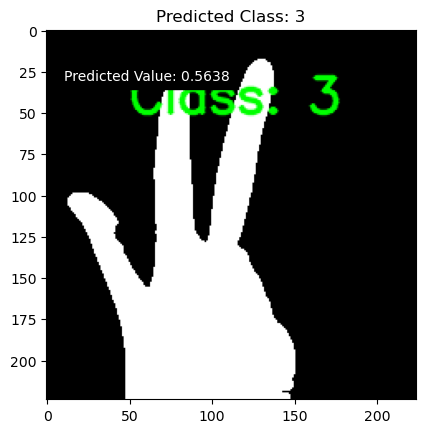

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


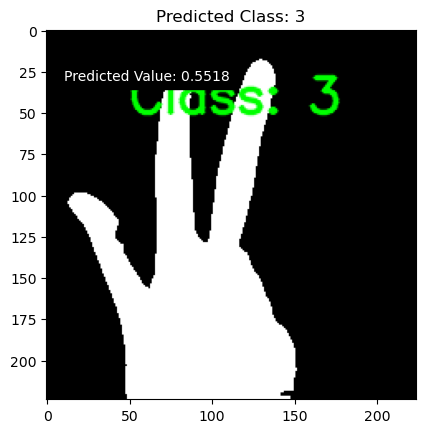

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


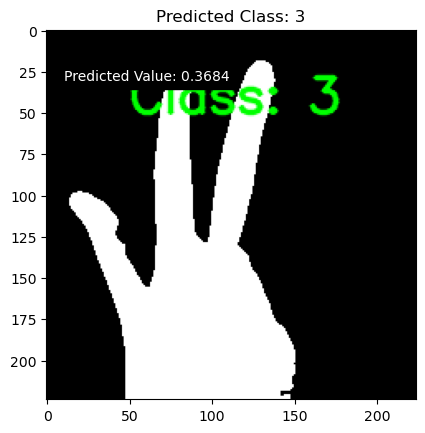

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


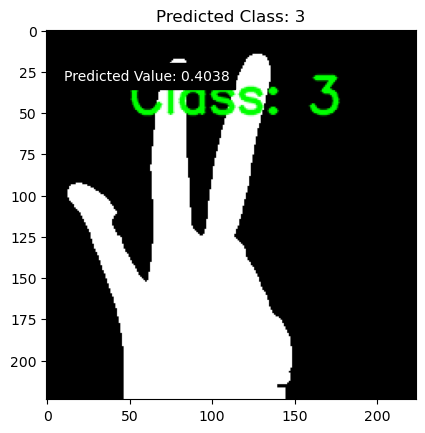

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


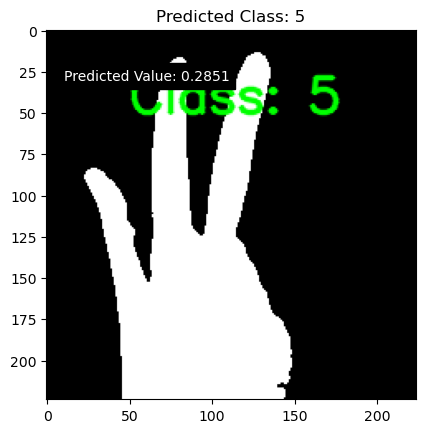

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


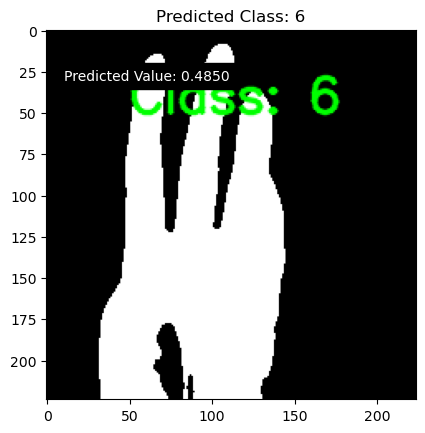

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


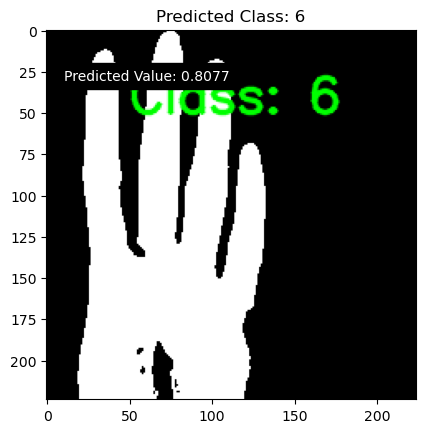

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


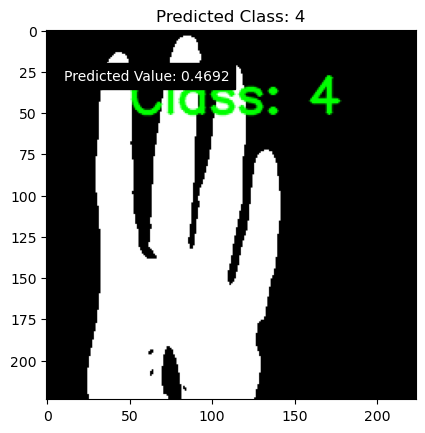

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


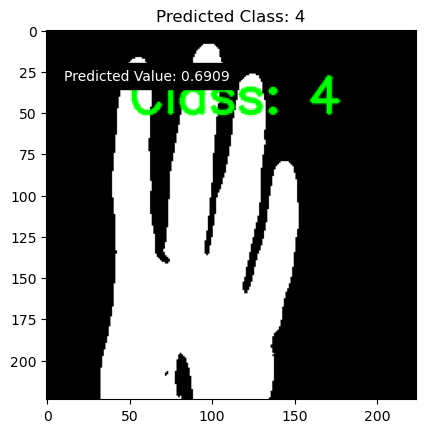

Hand detecting for prediction
1/1 [==============================] - 0s 32ms/step


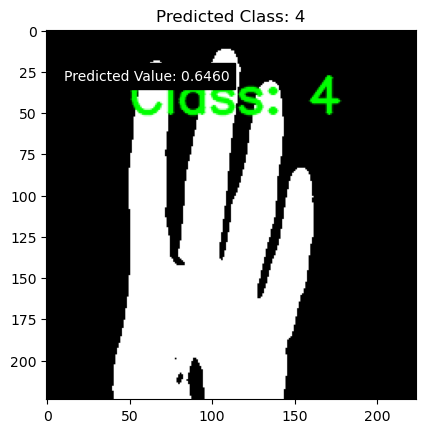

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


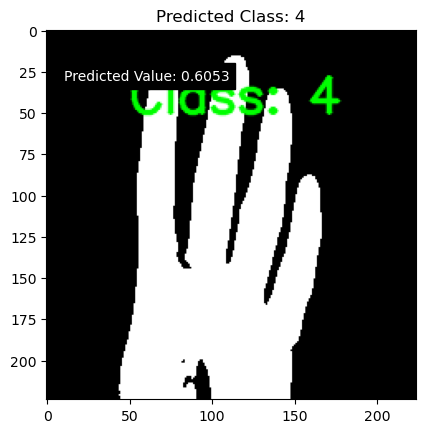

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


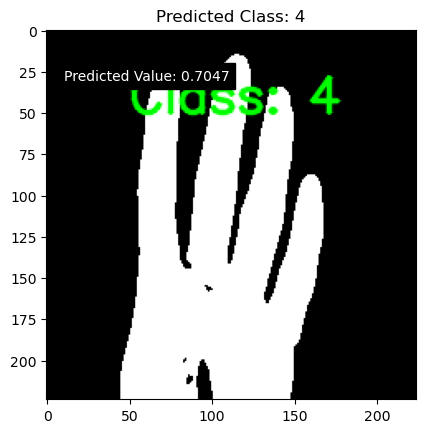

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


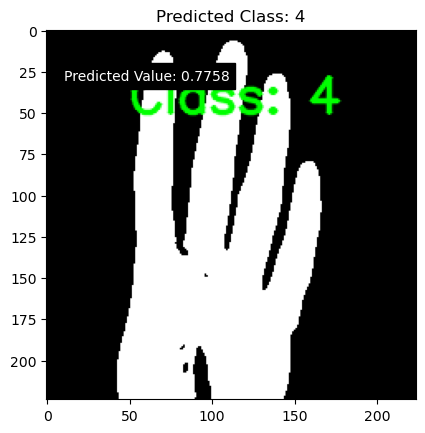

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


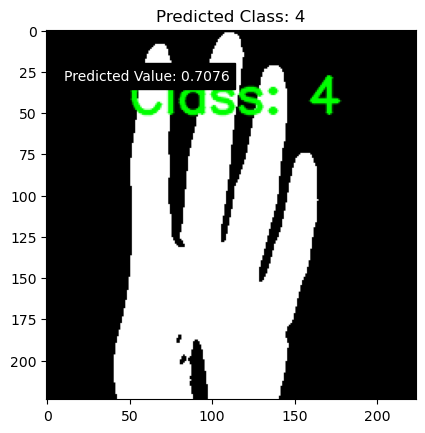

Hand detecting for prediction
1/1 [==============================] - 0s 20ms/step


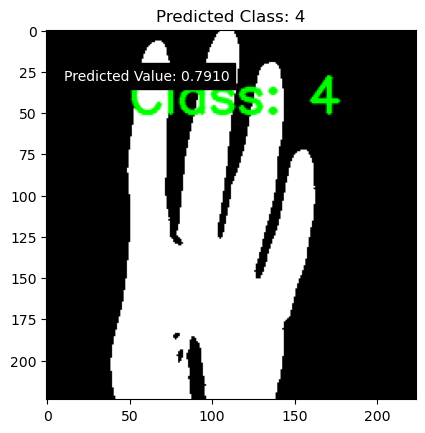

Hand detecting for prediction
1/1 [==============================] - 0s 36ms/step


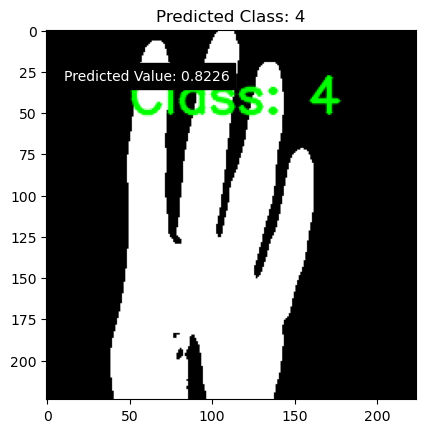

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


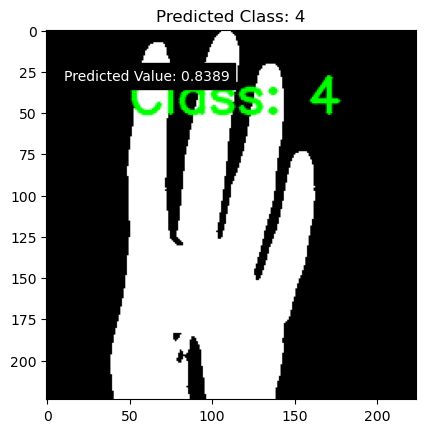

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


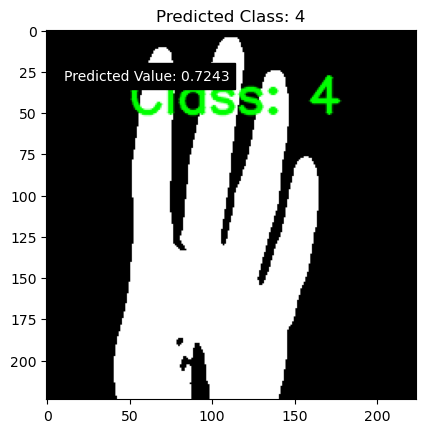

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


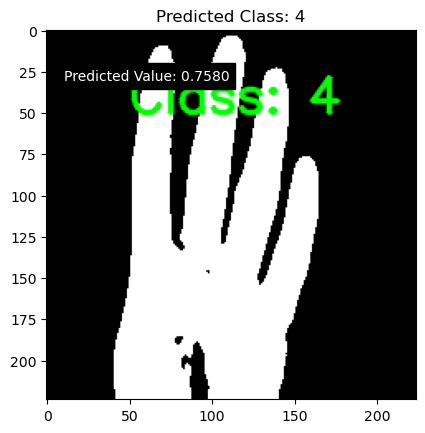

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


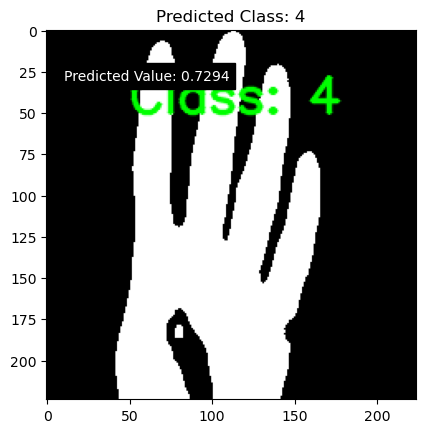

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


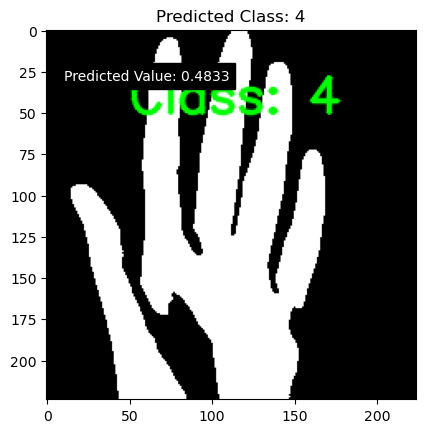

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


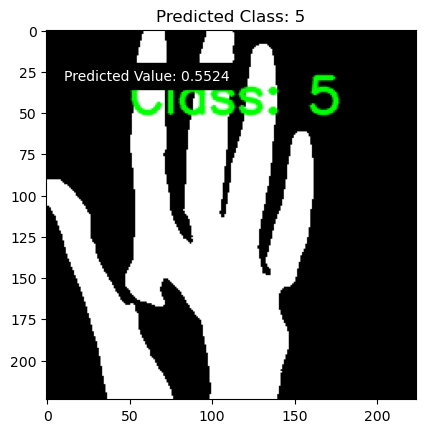

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


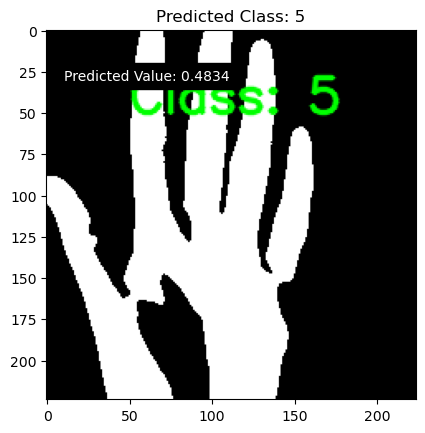

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


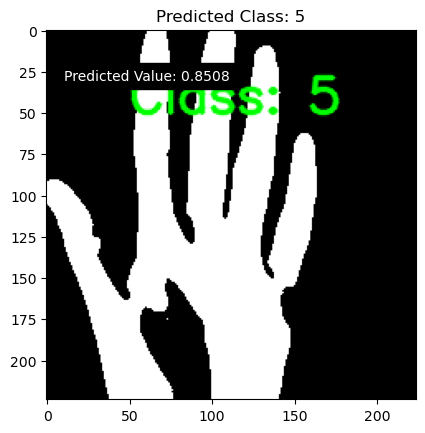

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


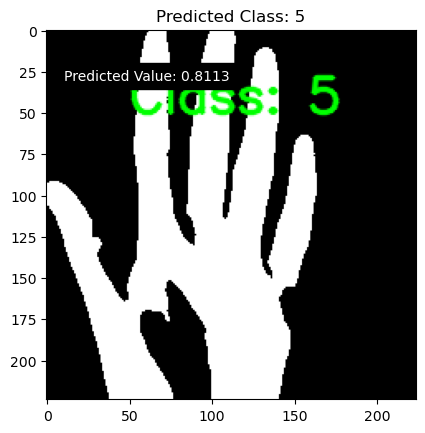

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


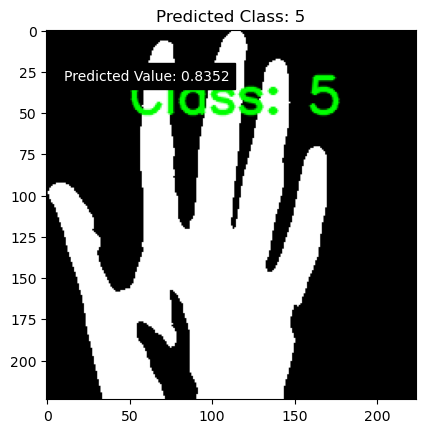

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


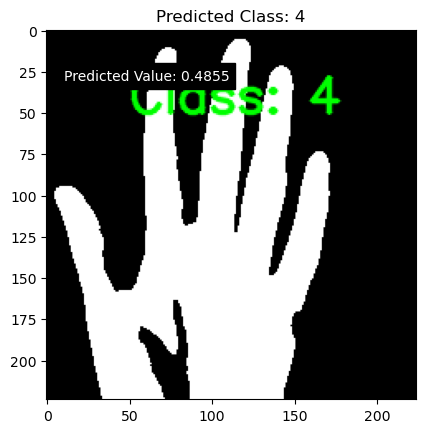

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


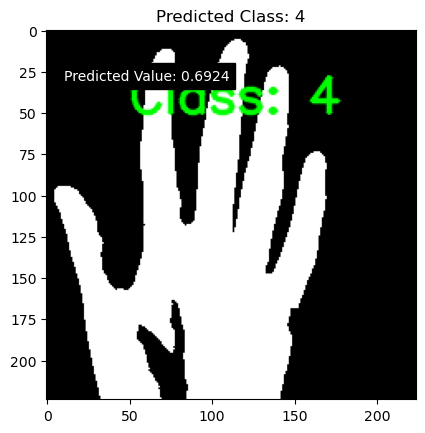

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


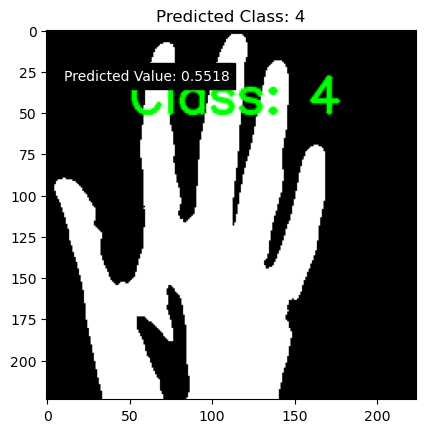

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


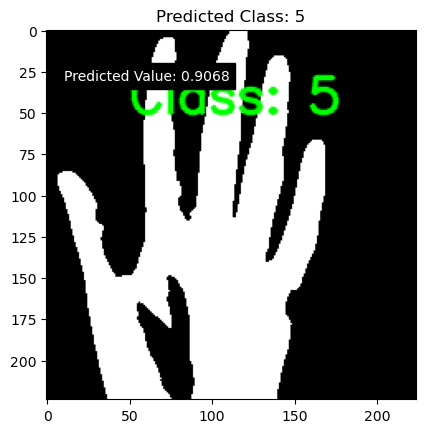

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


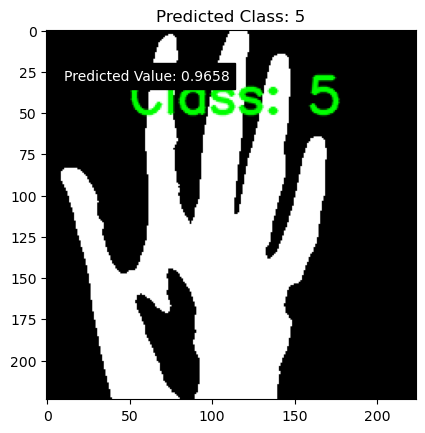

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


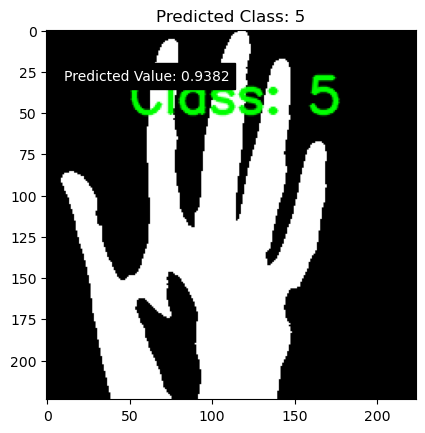

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


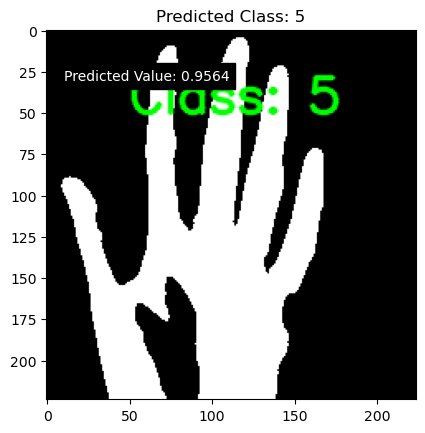

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


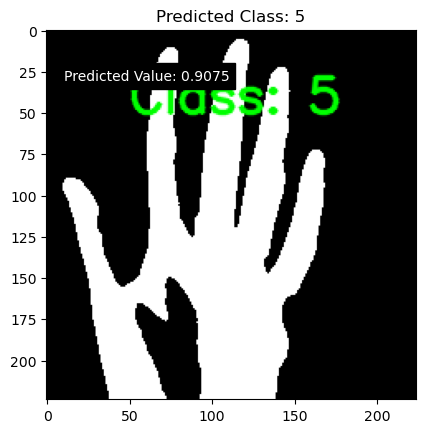

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


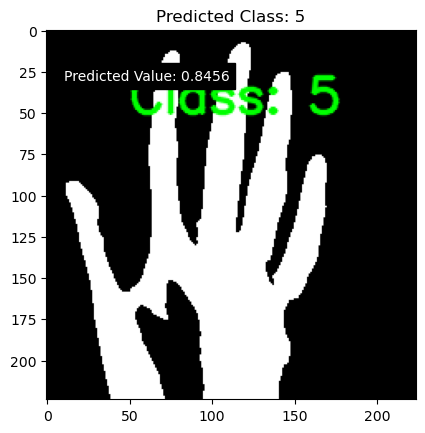

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


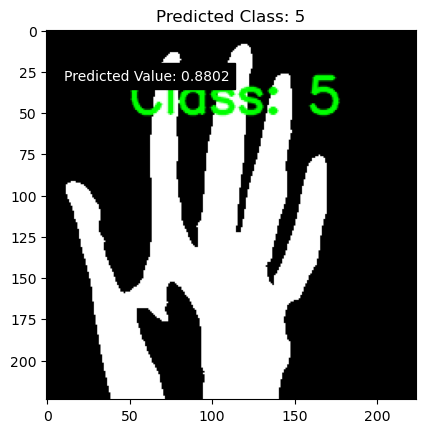

Hand detecting for prediction
1/1 [==============================] - 0s 36ms/step


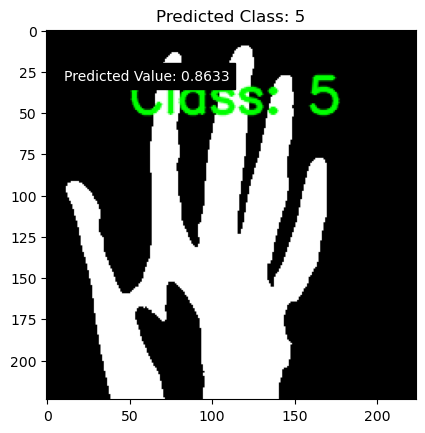

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


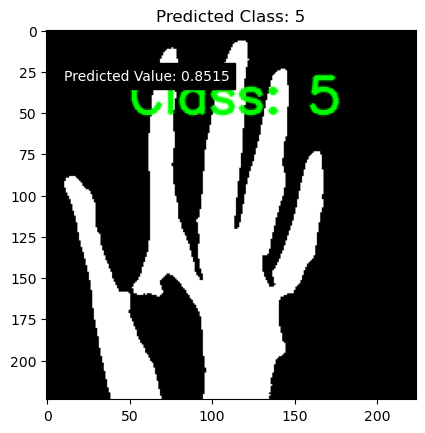

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


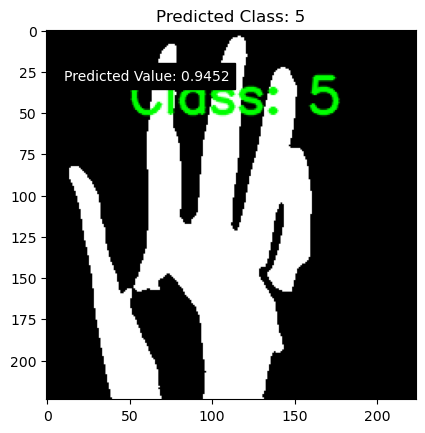

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


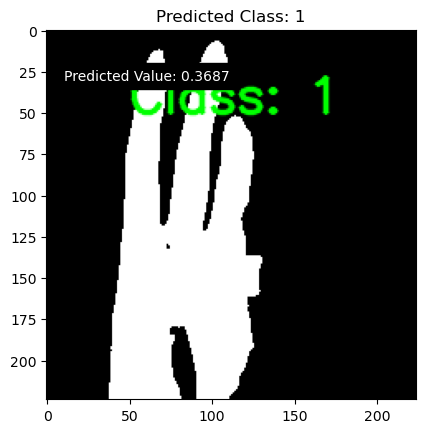

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


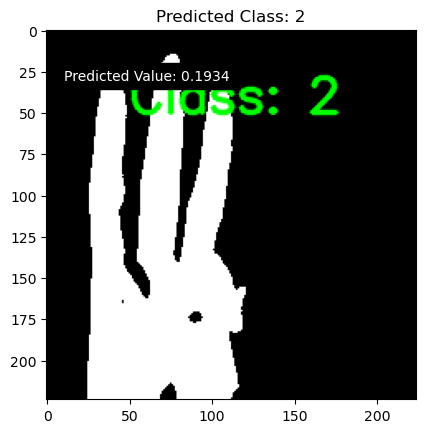

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


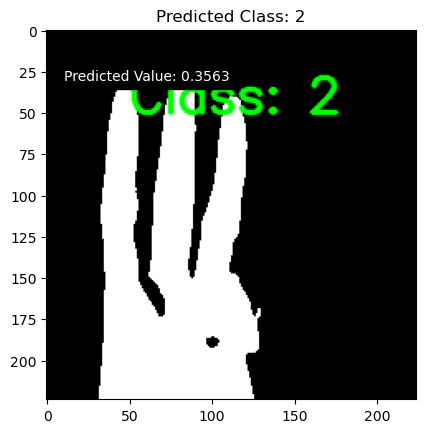

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


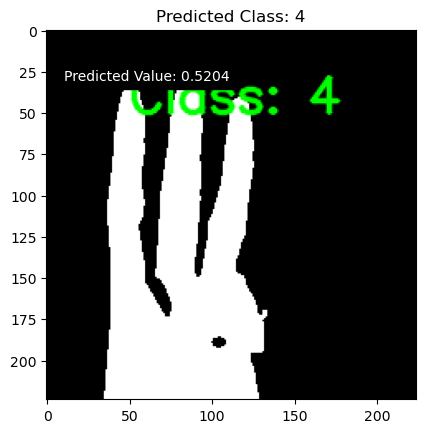

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


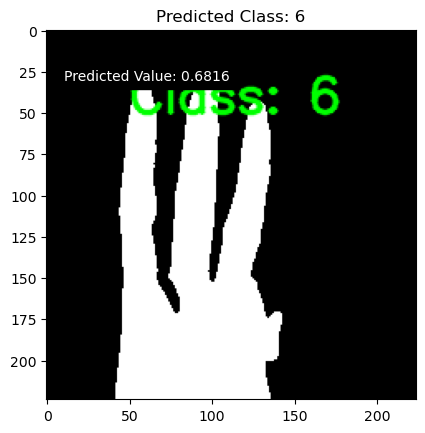

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


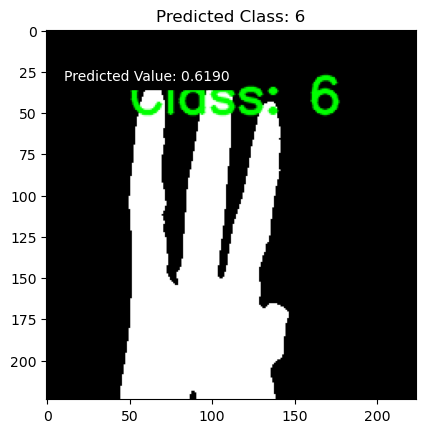

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


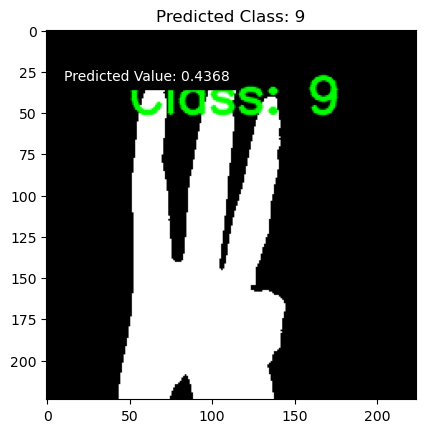

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


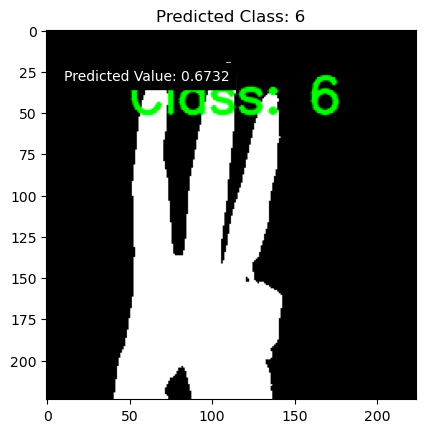

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


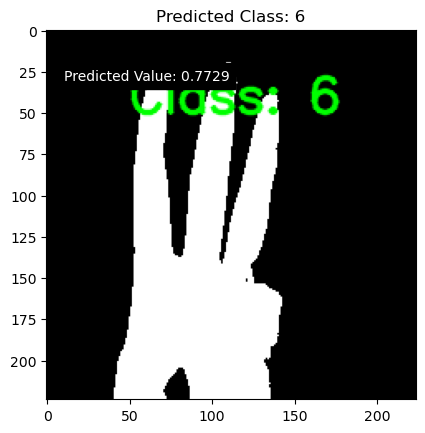

Hand detecting for prediction
1/1 [==============================] - 0s 38ms/step


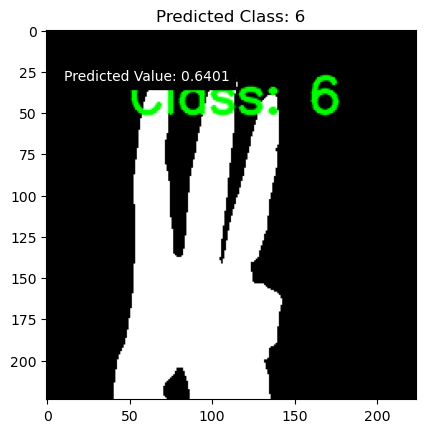

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


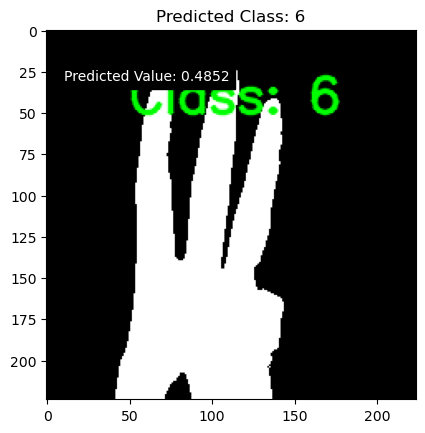

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


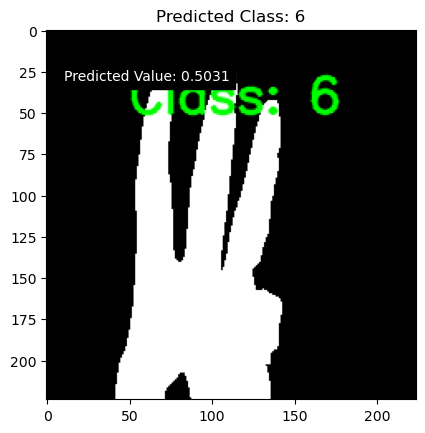

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


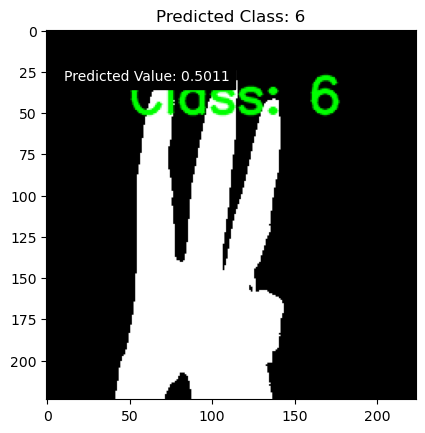

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


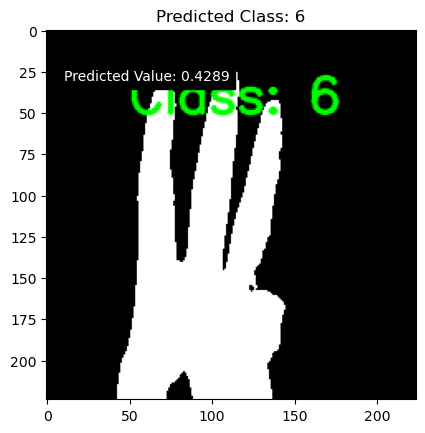

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


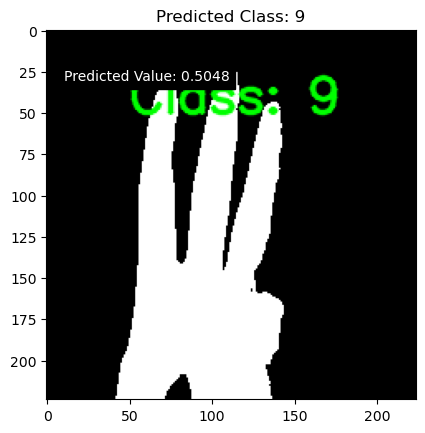

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


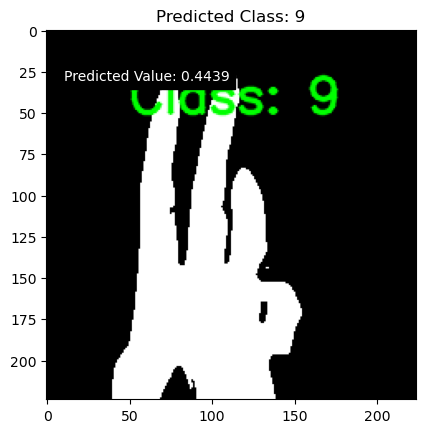

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


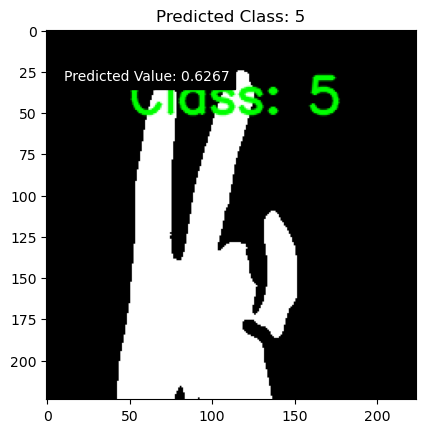

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


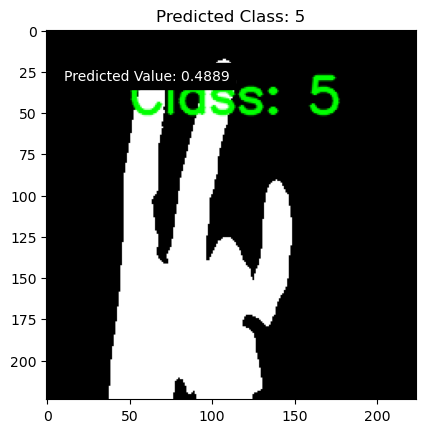

Hand detecting for prediction
1/1 [==============================] - 0s 43ms/step


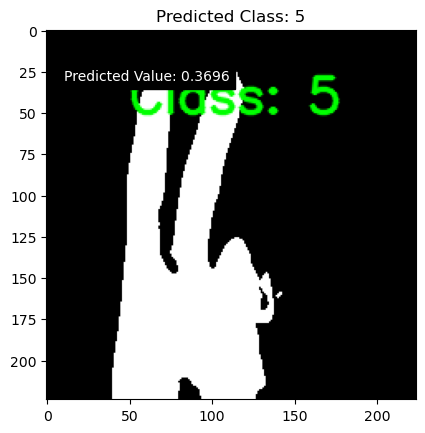

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


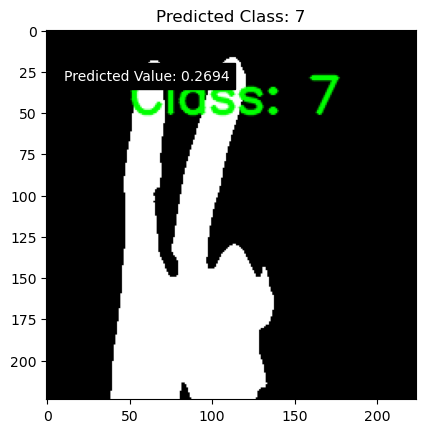

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


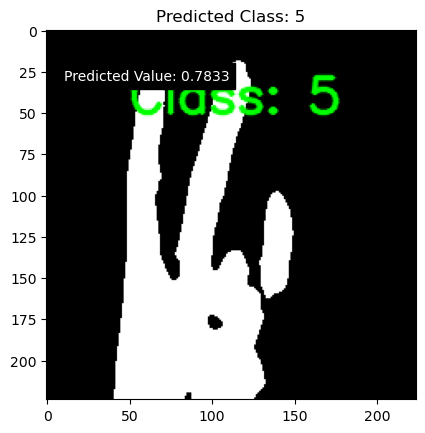

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


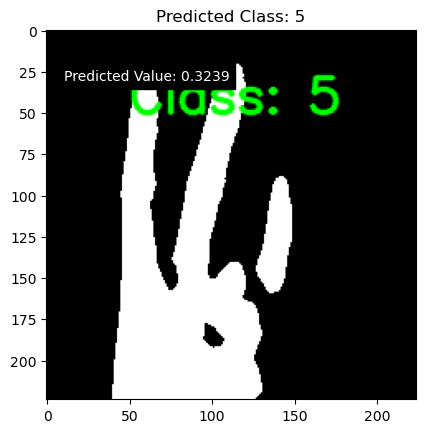

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


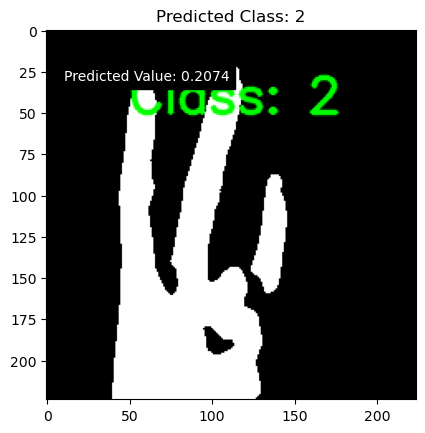

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


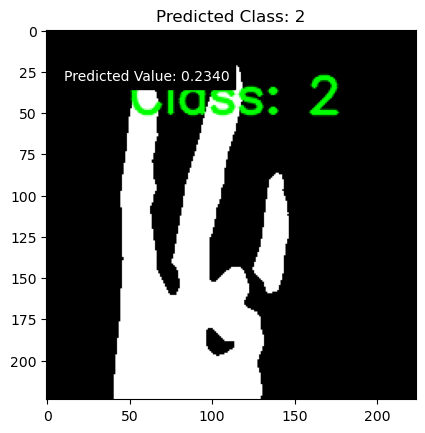

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


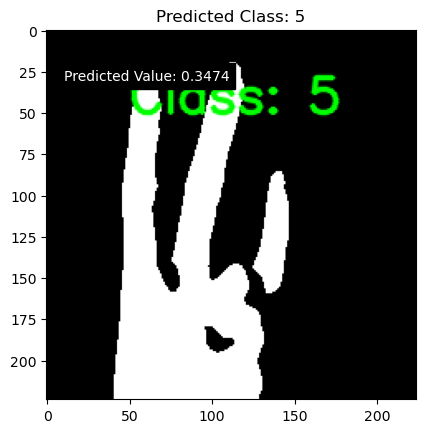

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


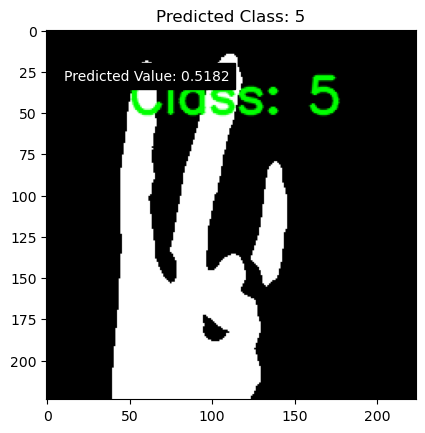

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


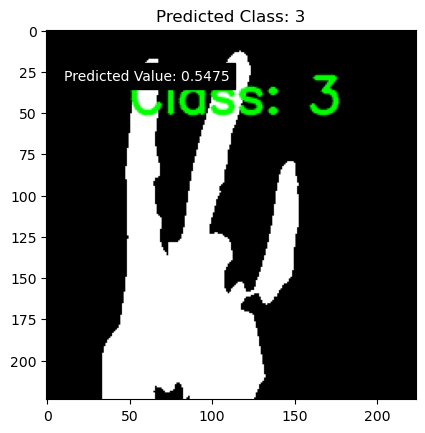

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


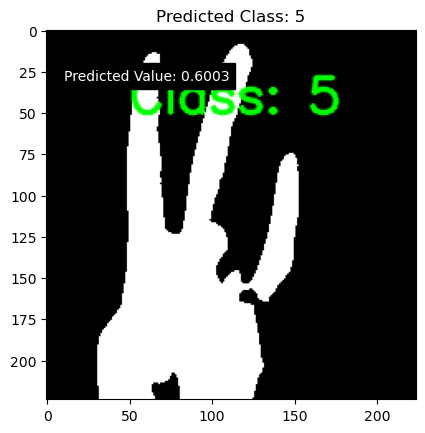

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


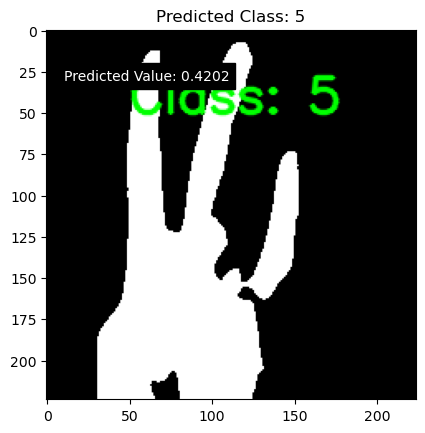

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


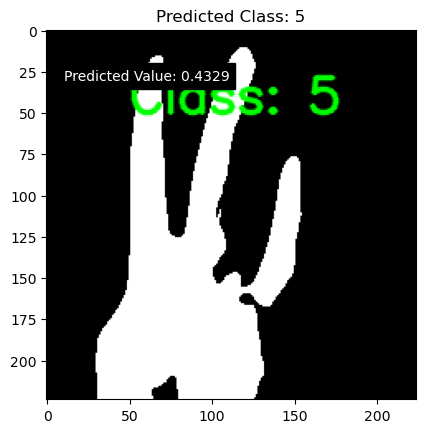

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


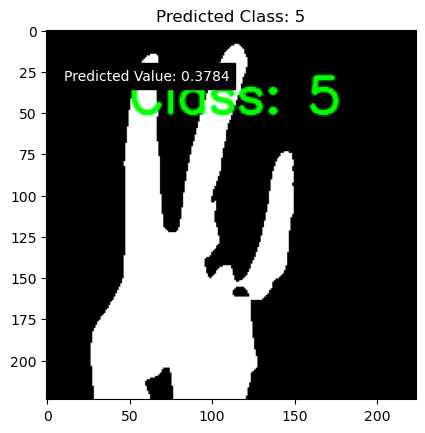

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


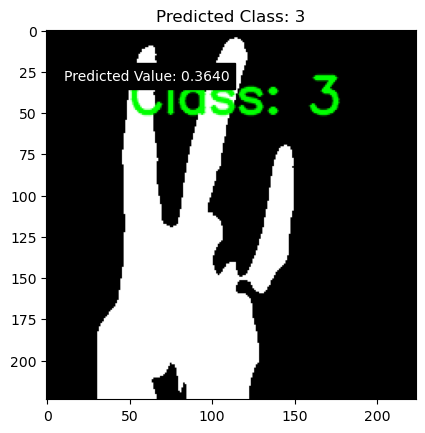

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


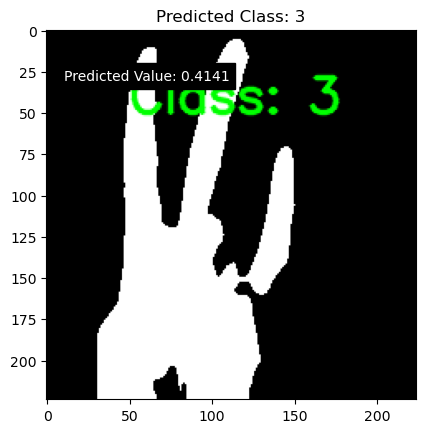

Hand detecting for prediction
1/1 [==============================] - 0s 35ms/step


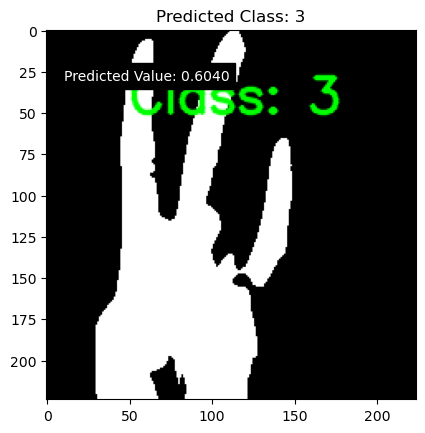

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


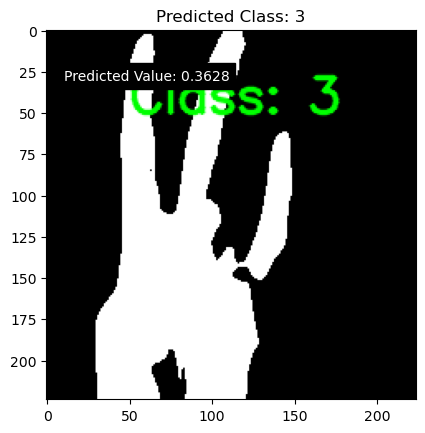

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


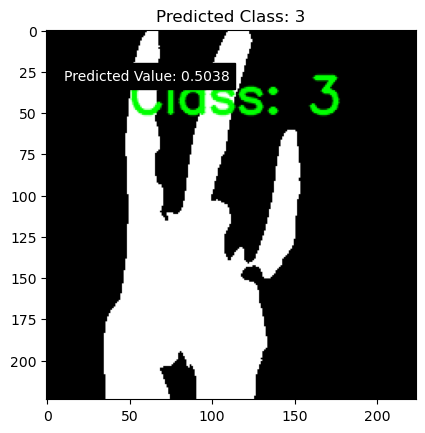

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


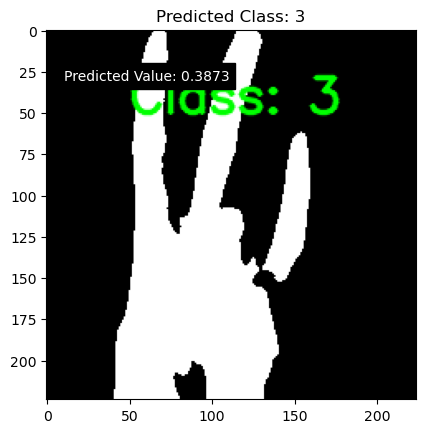

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


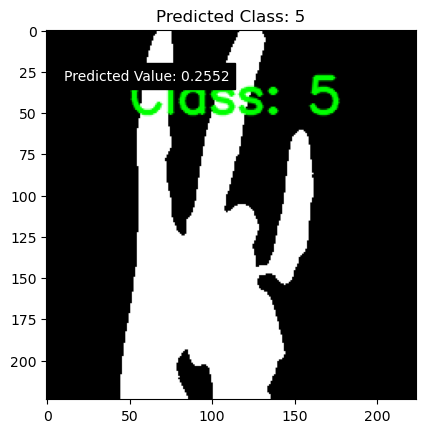

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


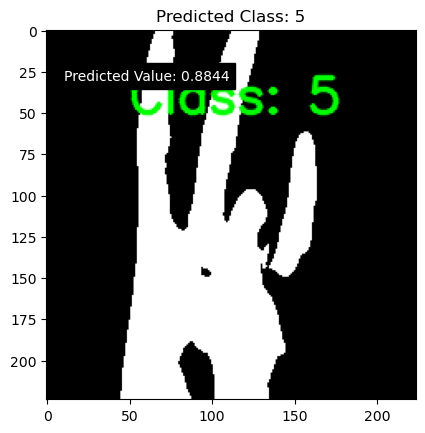

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


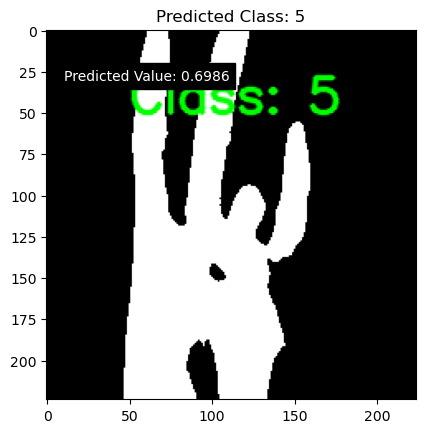

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


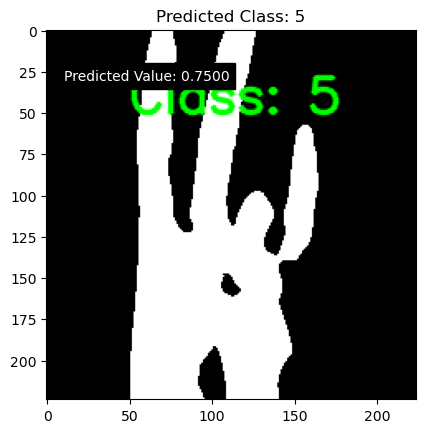

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


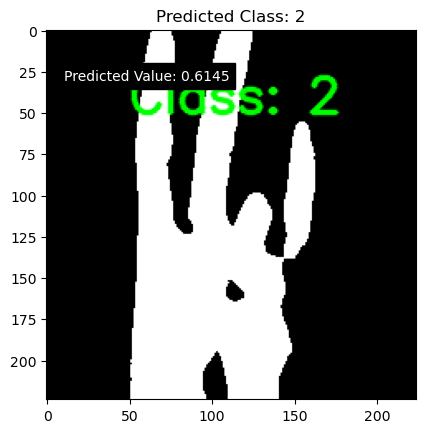

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


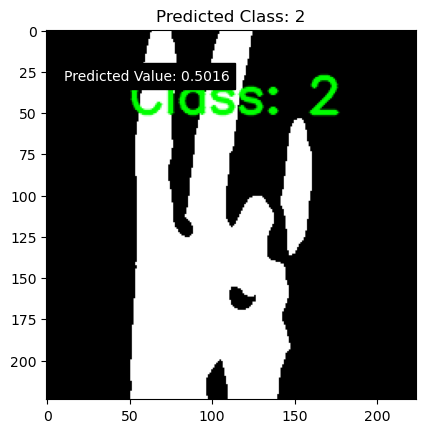

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


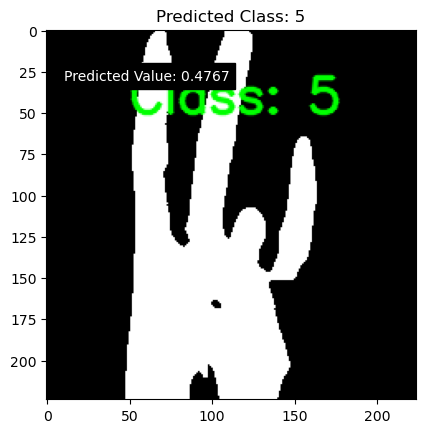

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


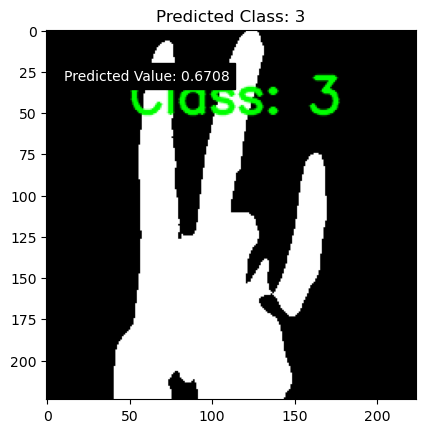

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


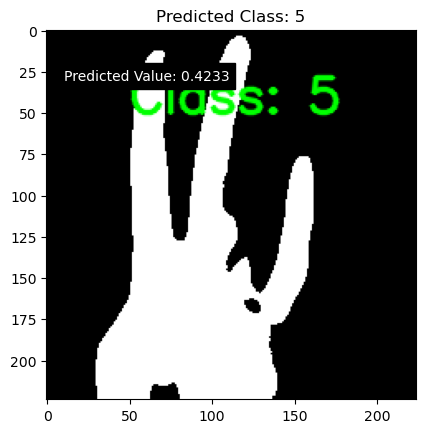

Hand detecting for prediction
1/1 [==============================] - 0s 45ms/step


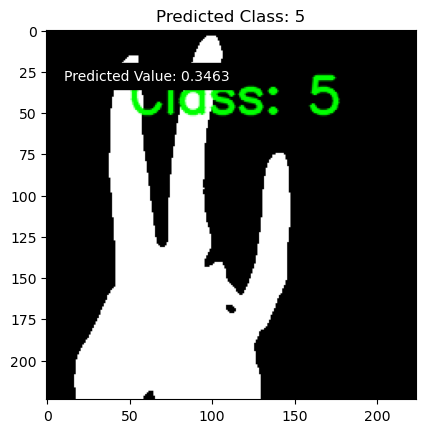

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


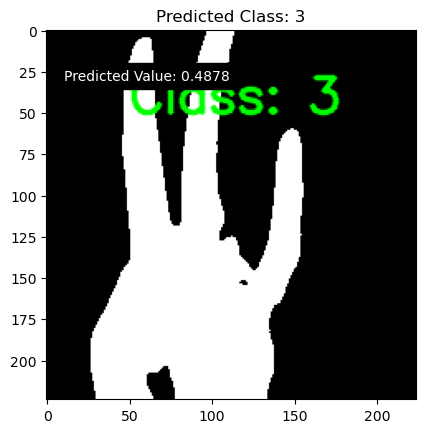

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


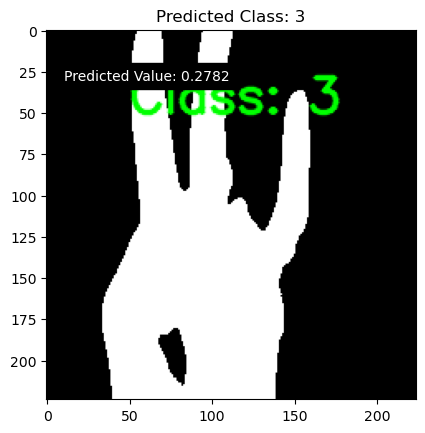

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


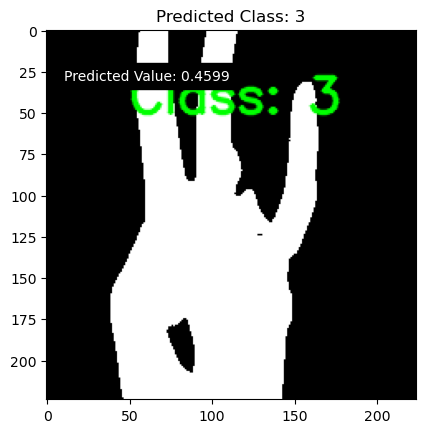

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


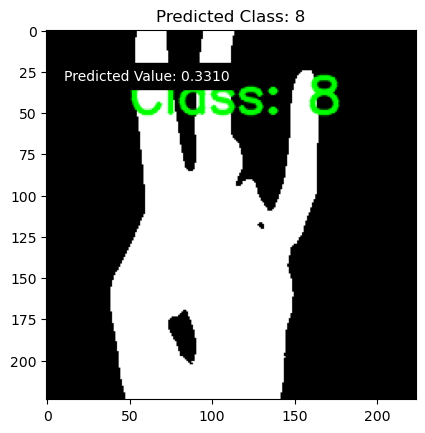

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


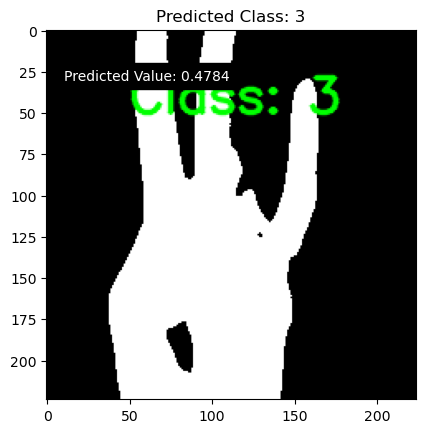

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


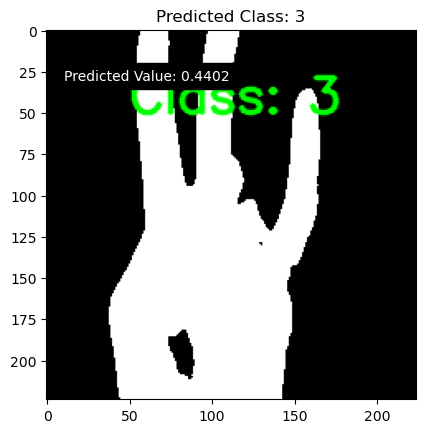

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


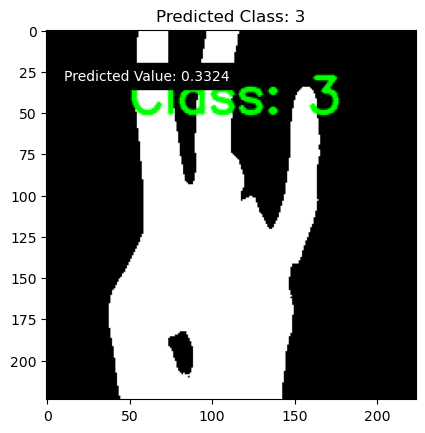

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


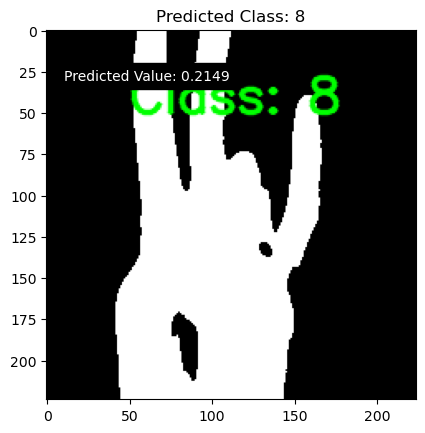

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


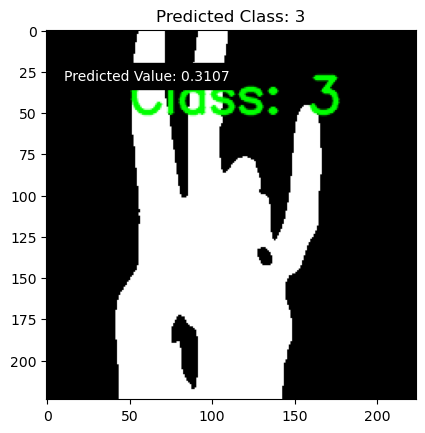

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


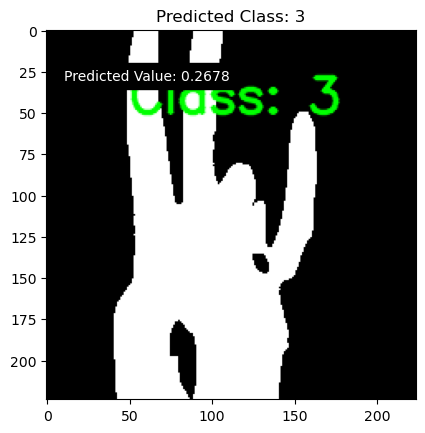

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


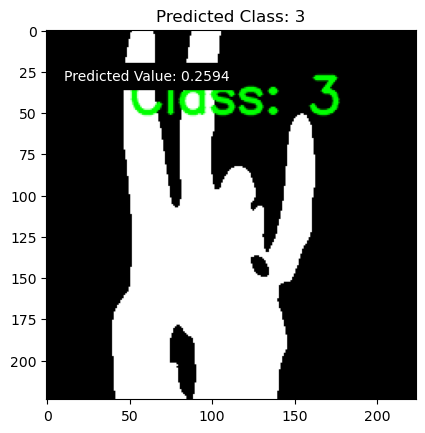

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


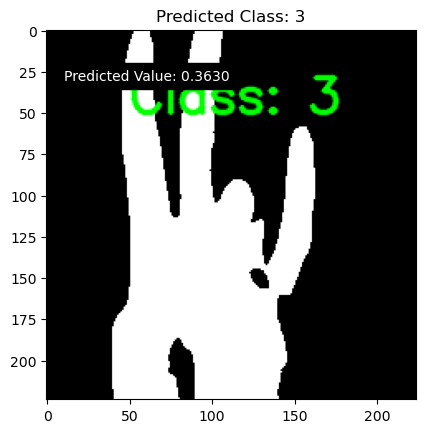

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


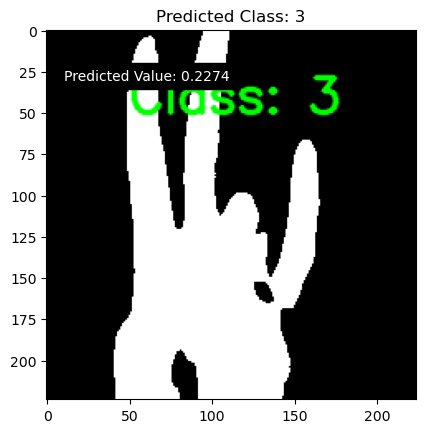

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


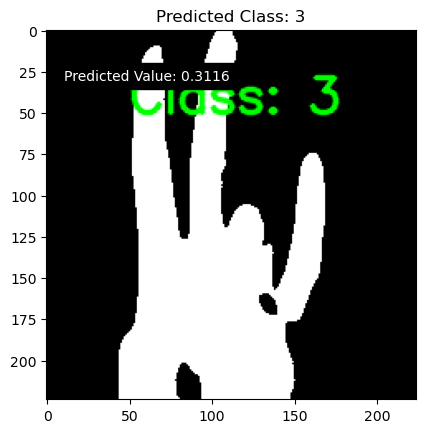

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


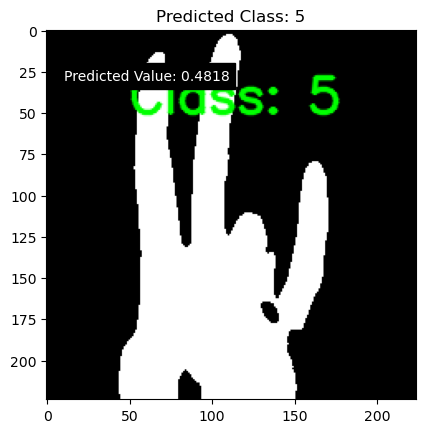

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


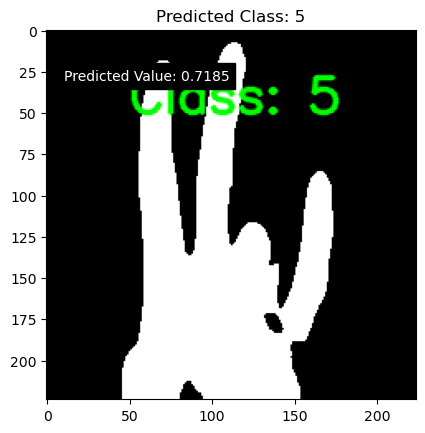

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


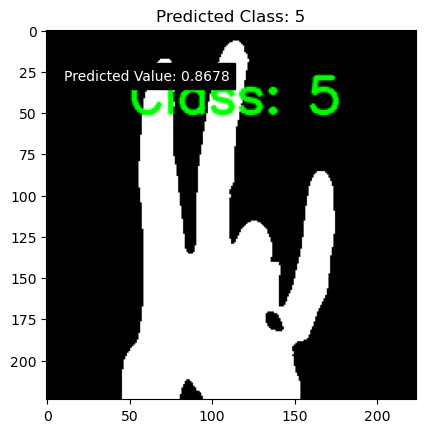

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


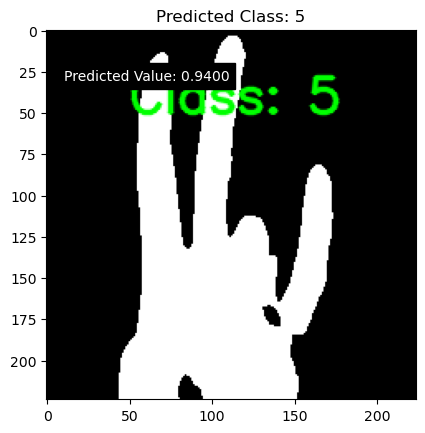

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


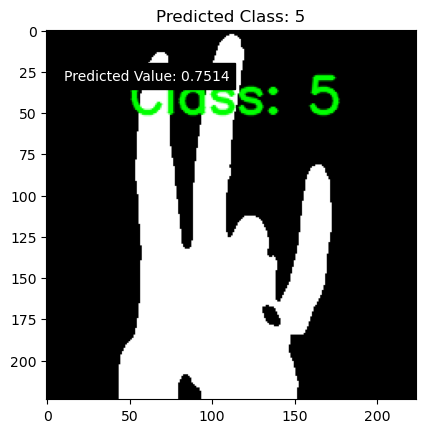

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


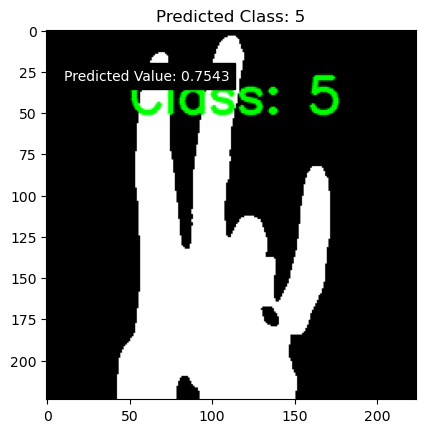

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


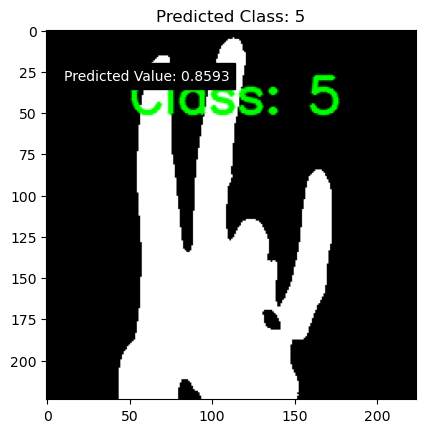

Hand detecting for prediction
1/1 [==============================] - 0s 33ms/step


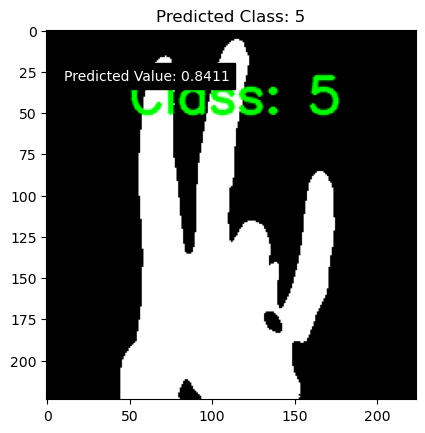

Hand detecting for prediction
1/1 [==============================] - 0s 34ms/step


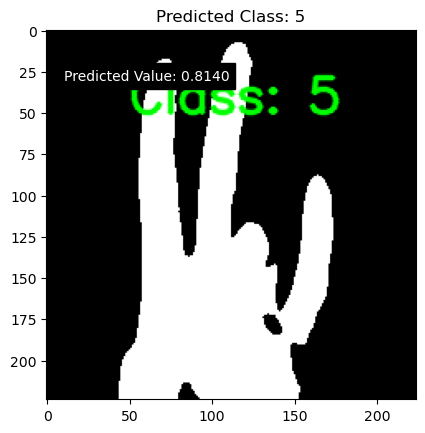

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


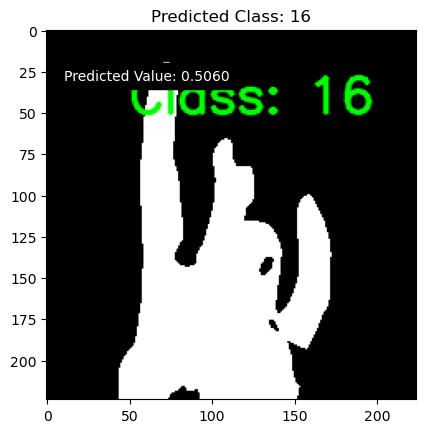

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


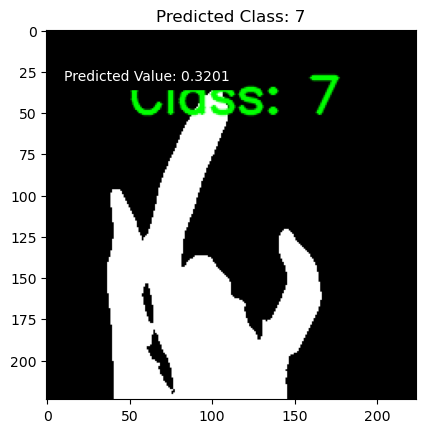

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


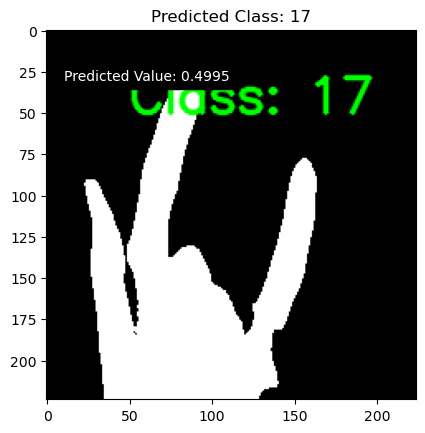

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


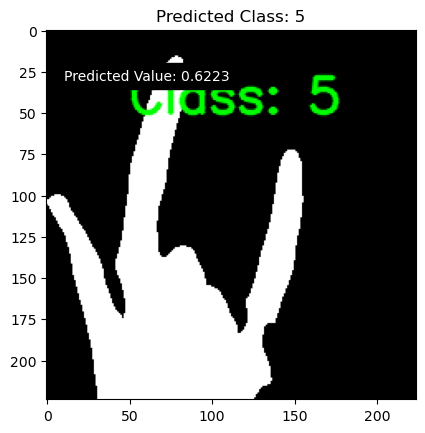

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


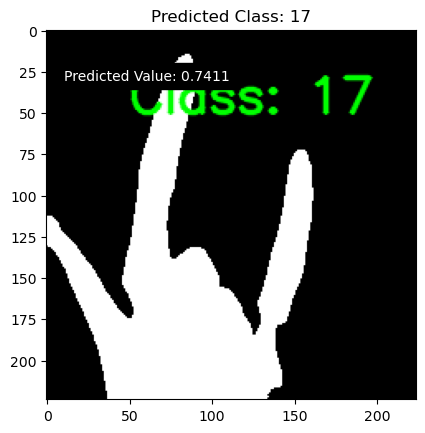

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


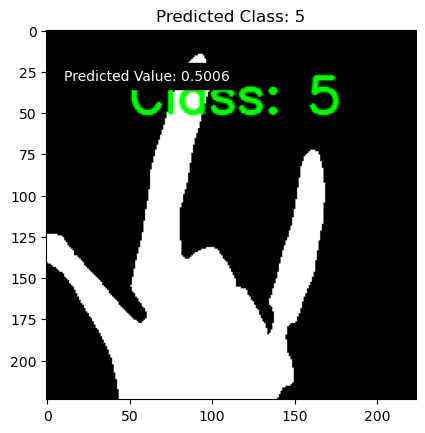

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


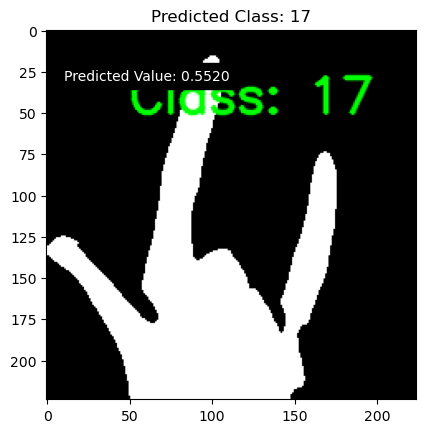

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


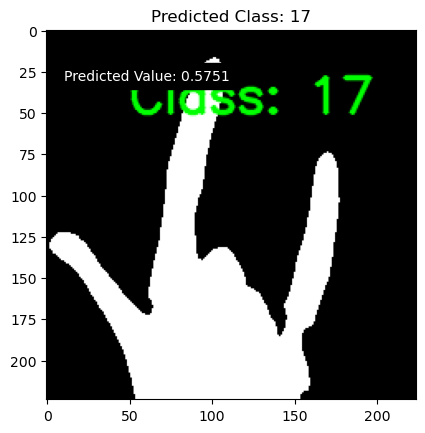

Hand detecting for prediction
1/1 [==============================] - 0s 32ms/step


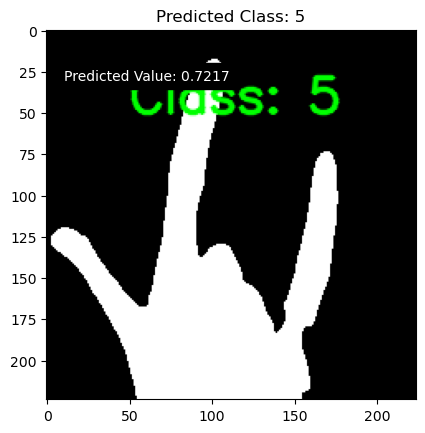

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


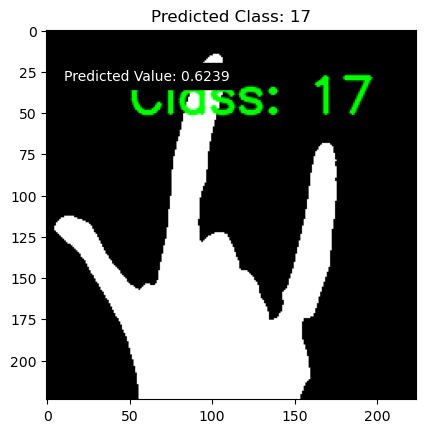

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


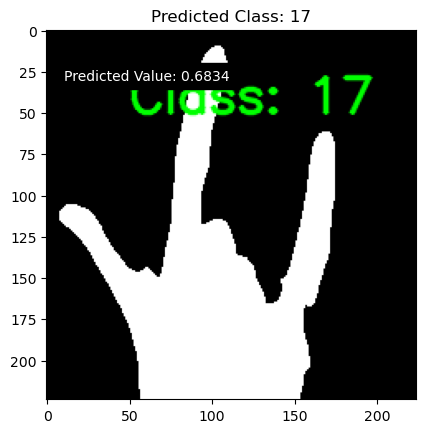

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


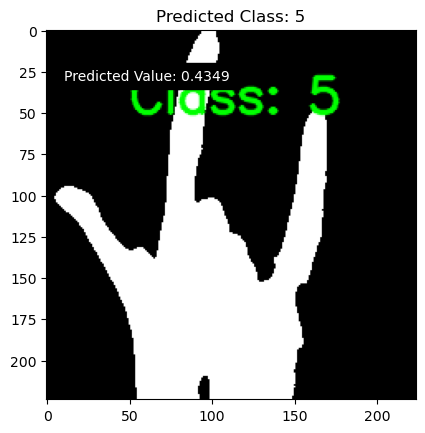

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


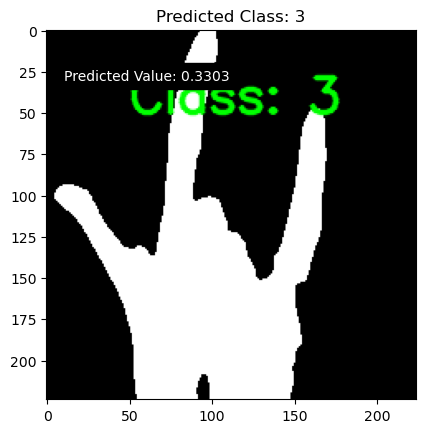

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


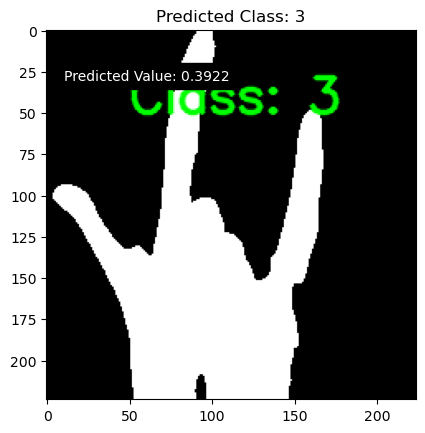

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


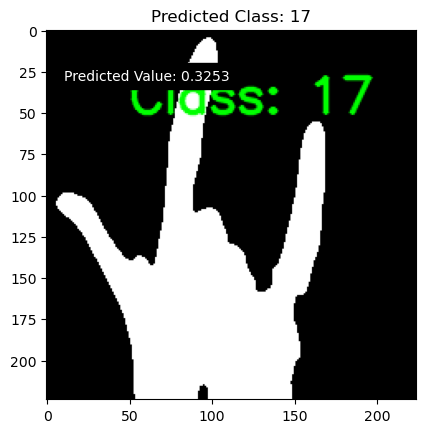

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


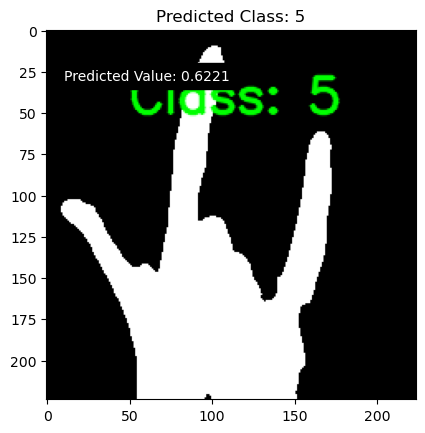

Hand detecting for prediction
1/1 [==============================] - 0s 20ms/step


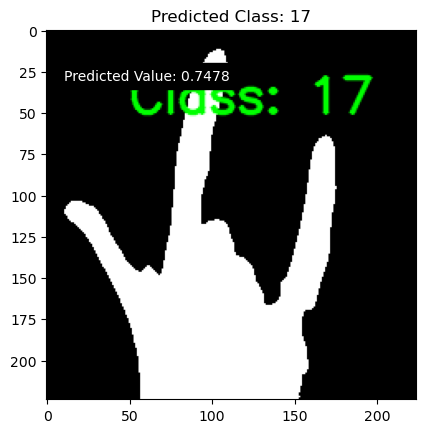

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


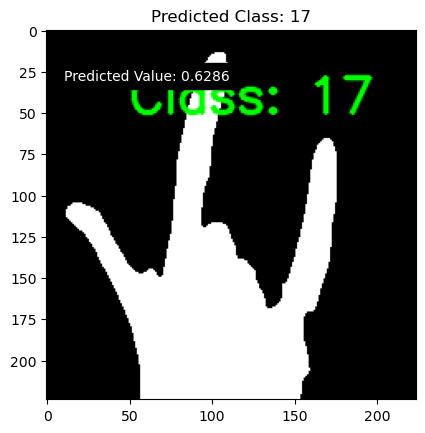

Hand detecting for prediction
1/1 [==============================] - 0s 37ms/step


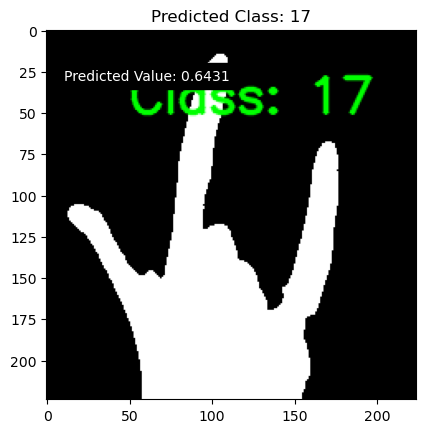

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


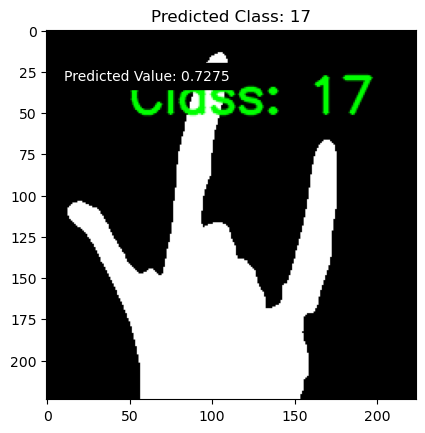

Hand detecting for prediction
1/1 [==============================] - 0s 34ms/step


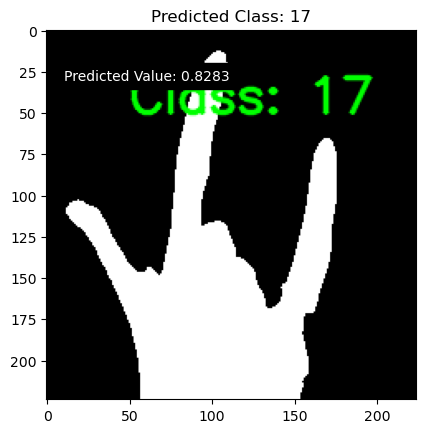

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


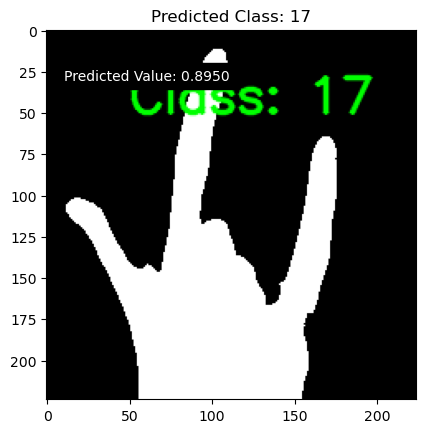

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


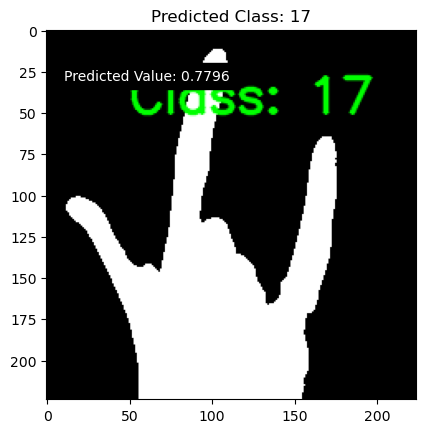

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


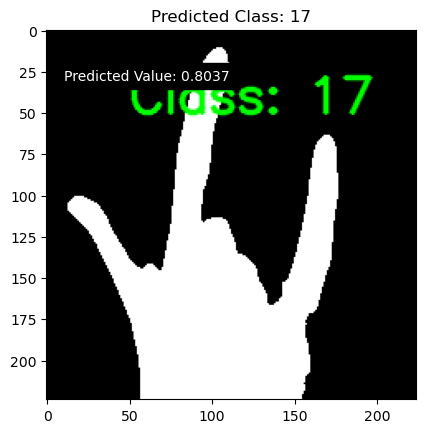

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


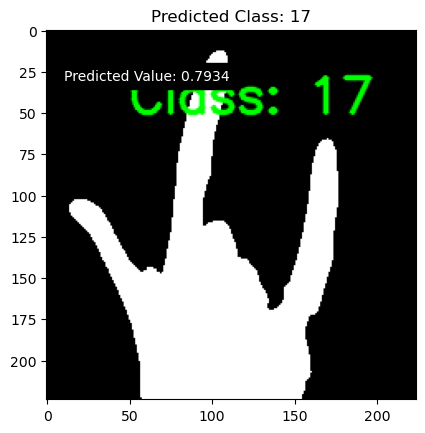

Hand detecting for prediction
1/1 [==============================] - 0s 28ms/step


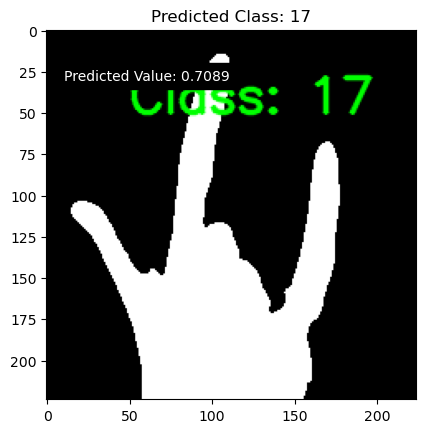

Hand detecting for prediction
1/1 [==============================] - 0s 22ms/step


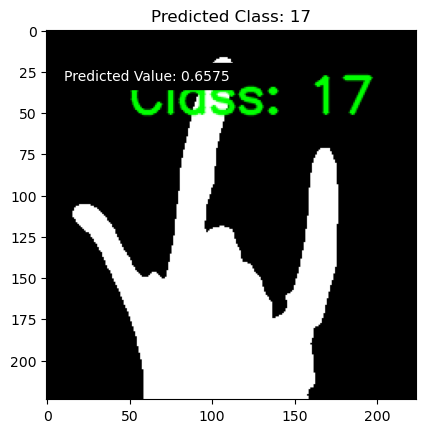

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


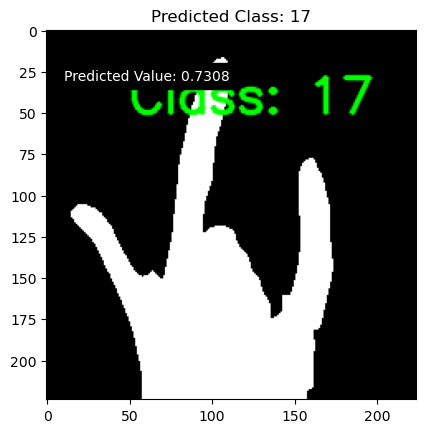

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


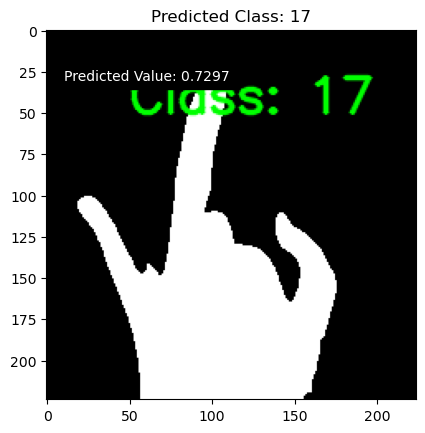

Hand detecting for prediction
1/1 [==============================] - 0s 32ms/step


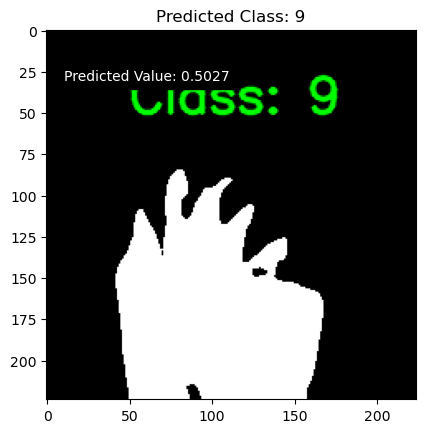

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


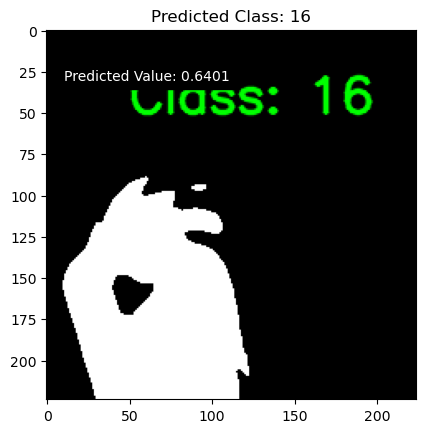

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


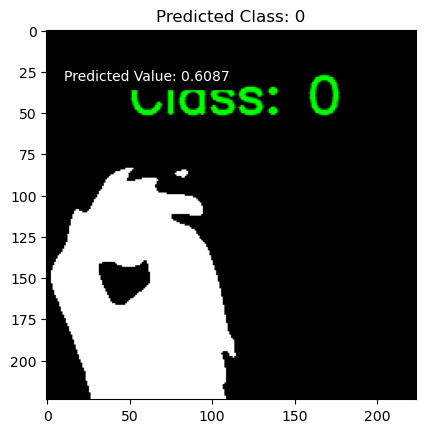

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


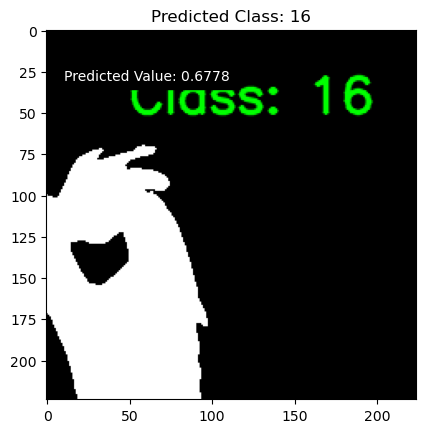

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


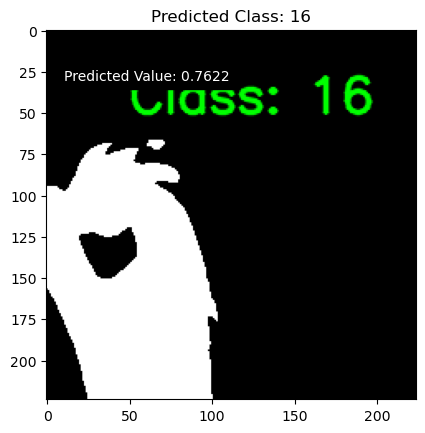

Hand detecting for prediction
1/1 [==============================] - 0s 27ms/step


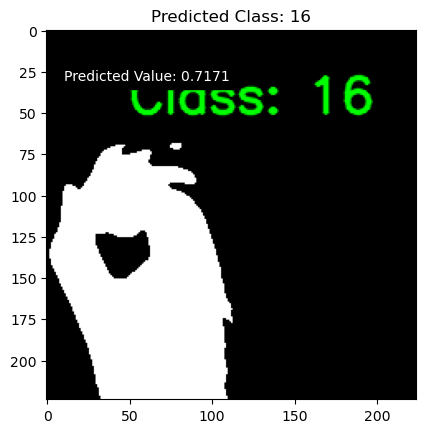

Hand detecting for prediction
1/1 [==============================] - 0s 21ms/step


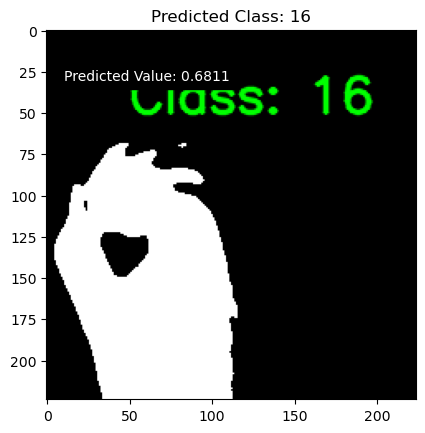

Hand detecting for prediction
1/1 [==============================] - 0s 30ms/step


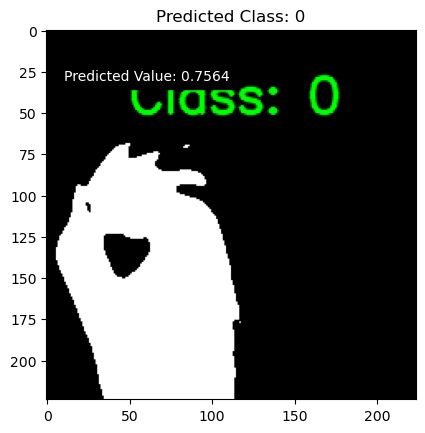

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


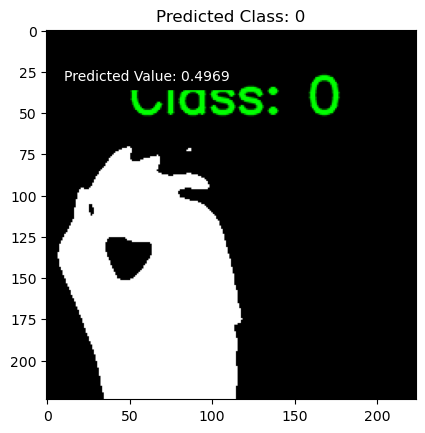

Hand detecting for prediction
1/1 [==============================] - 0s 21ms/step


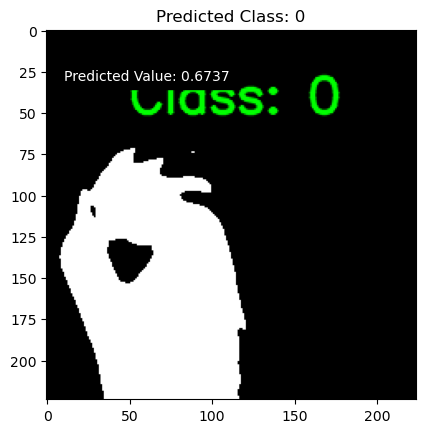

Hand detecting for prediction
1/1 [==============================] - 0s 25ms/step


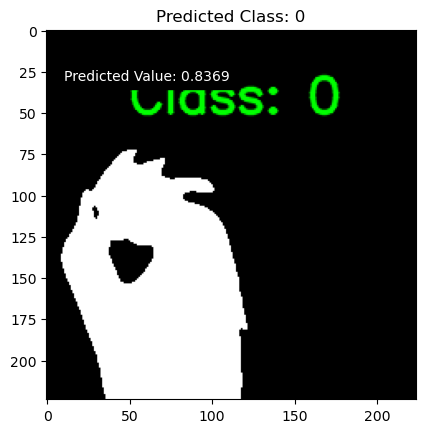

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


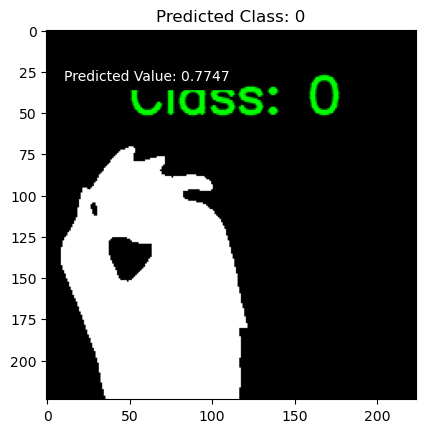

Hand detecting for prediction
1/1 [==============================] - 0s 31ms/step


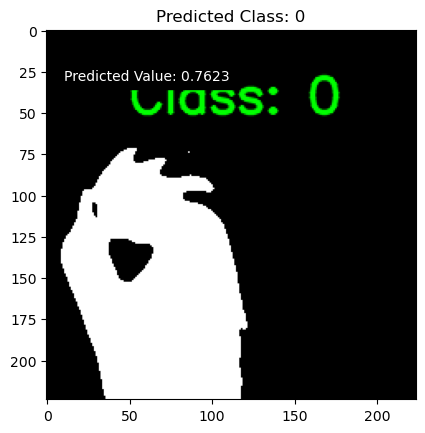

Hand detecting for prediction
1/1 [==============================] - 0s 23ms/step


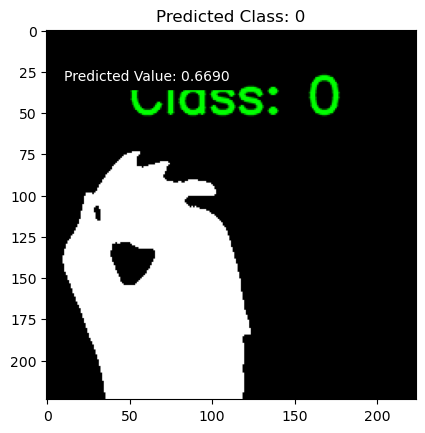

Hand detecting for prediction
1/1 [==============================] - 0s 26ms/step


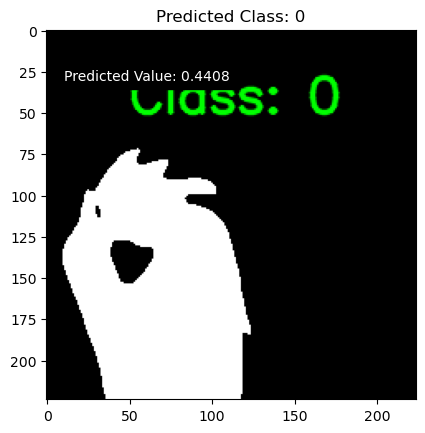

Hand detecting for prediction
1/1 [==============================] - 0s 24ms/step


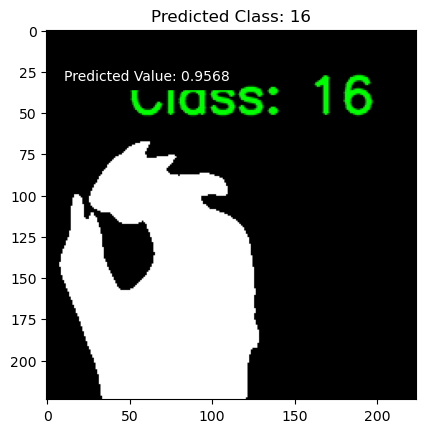

Hand detecting for prediction
1/1 [==============================] - 0s 29ms/step


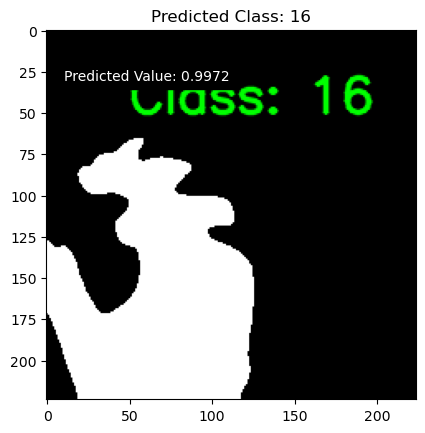

In [23]:
## Capturing the video sequence
cap = cv2.VideoCapture(0)
cap.set(cv2.CAP_PROP_FRAME_WIDTH,1280)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT,720)

aweight = 0.5
num_frames = 0
bg = None

def run_avg(img,aweight):
    global bg
    if bg is None:
        bg = img.copy().astype('float')
        return
    cv2.accumulateWeighted(img,bg,aweight)

def segment(img,thres=30):
    global bg
    diff = cv2.absdiff(bg.astype('uint8'),img)
    _, thresholded = cv2.threshold(diff,thres,255,cv2.THRESH_BINARY)
    contours,_ = cv2.findContours(thresholded.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return
    else:
        segmented = max(contours,key = cv2.contourArea)
    return (thresholded,segmented)

while(cap.isOpened()):
    ret, frame = cap.read()

    if ret ==True:
        frame = cv2.flip(frame, 1)
        clone = frame.copy()
        (height, width) = frame.shape[:2]
        roi = frame[300:600, 700:1100]
        
        # Resize the roi to the desired size (e.g., 224x224)
        roi = cv2.resize(roi, (224, 224))
        
        gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        gray = cv2.GaussianBlur(gray, (7, 7), 0)

        if num_frames < 30:
            run_avg(gray, aweight)
        else:
            hand = segment(gray)

            if hand is not None:
                (thresholded, segmented) = hand
                cv2.drawContours(clone, [segmented + (300, 100)], -1, (0, 0, 255))
                # cv2.imshow("Thesholded", thresholded)
                contours, _= cv2.findContours(thresholded,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

                for cnt in contours:
                    if cv2.contourArea(cnt) > 5000:
                        print("Hand detecting for prediction")
                        thresholded = cv2.cvtColor(thresholded, cv2.COLOR_BGR2RGB)
                        # Add a batch dimension
                        input_tensor = tf.expand_dims(thresholded, axis=0)

                        # Perform inference
                        predictions = model.predict(input_tensor)

                        # Get the predicted class index
                        predicted_class = np.argmax(predictions)
                        label = f"Class: {predicted_class}"
                        cv2.putText(thresholded, label, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)

                        # Display the frame
                        cv2.imshow('Live Hand Gesture Detection', thresholded)
                        
                        # Display the input_tensor using Matplotlib
                        plt.imshow(thresholded)
                        plt.title(f'Predicted Class: {predicted_class}')
                        plt.text(10, 30, f'Predicted Value: {predictions[0][predicted_class]:.4f}', color='white', backgroundcolor='black', fontsize=10)
                        plt.show()

        num_frames += 1

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break
cap.release()

cv2.waitKey()
cv2.destroyAllWindows()